# Notebook Objective and Setup

BGG05 holds the EDA and visualization for the game data.

Most of this notebook is outside of the scope of the recommendation engine, and serves largely as a visualization and exploration playground to find interesting details about the data.

## Package Imports

In [2]:
import pandas as pd
import numpy as np
import requests
import regex as re
import time
import os
import gc

# ignore warnings (gets rid of Pandas copy warnings)
import warnings
warnings.filterwarnings('ignore')
pd.options.display.max_columns = None

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 60)


# preprocessing
from statsmodels.tsa.stattools import adfuller
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, PolynomialFeatures, MinMaxScaler, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from sklearn.experimental import enable_halving_search_cv
from sklearn.model_selection import train_test_split, cross_validate, HalvingGridSearchCV, validation_curve, cross_val_score, GridSearchCV, KFold, RepeatedKFold, RandomizedSearchCV
from missingpy import MissForest
import sklearn.cluster as cluster

# model tools
import statsmodels.api as sm
from statsmodels.formula.api import ols

import scipy.stats as stats
from scipy.stats import norm

from sklearn.linear_model import LinearRegression, BayesianRidge, ElasticNet, GammaRegressor, HuberRegressor,  Lars, Lasso, SGDRegressor
from sklearn.linear_model import LassoLars, OrthogonalMatchingPursuit, PassiveAggressiveRegressor, PoissonRegressor, RANSACRegressor, Ridge
from sklearn.tree import DecisionTreeRegressor
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.svm import SVR, LinearSVR, NuSVR
from sklearn.feature_selection import RFECV
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor, ExtraTreesRegressor, AdaBoostRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.kernel_ridge import KernelRidge
import xgboost as xgb

# scoring and algorithm selection packages
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score 
from sklearn.inspection import permutation_importance

# visualization packages
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import umap
import umap.plot

# NLP tools
#import tokenization
import spacy
nlp = spacy.load("en_core_web_sm")
import re
import nltk
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from nltk.tokenize import word_tokenize



## Notebook Functions

In [3]:
def processing_pipeline(continuous, poly, cats, overall, train, holdout):
    
    # polynomials pipeline
    poly_pipeline = Pipeline([
        ('scaler', MinMaxScaler()),
        ('polynomials', PolynomialFeatures(degree=3, include_bias=False))
        ])
    
    # continuous pipeline
    cont_pipeline = Pipeline([
        ('imputer', MissForest()),
        ('scaler', StandardScaler()),
         ])
    
    
    # Whole pipeline with continuous, poly, cate transformers
    total_pipeline = ColumnTransformer([
        ('continuous', cont_pipeline, continuous),
        ('polynomials', poly_pipeline, poly),
        ('categorical', OneHotEncoder(drop='if_binary'), cats),
        ], sparse_threshold=0)
    
    # Fit and tranform the pipeline on x_train, then transform x_test
    processed_train = pd.DataFrame(total_pipeline.fit_transform(train), columns=overall)
    processed_test = pd.DataFrame(total_pipeline.transform(holdout), columns=overall)
    
    
    return processed_train, processed_test

In [4]:
def score_model(model, x, y, model_type, score_list):
    
    # get accuracy cross val score for cv 5
    scores = cross_validate(model, x, y, cv=5, n_jobs=-1,
        scoring=('r2', 'neg_mean_absolute_error', 'neg_root_mean_squared_error'),
        return_train_score=True)
    r2 = round(scores['test_r2'].mean()*100,2)
    mae = abs(round(scores['test_neg_mean_absolute_error'].mean(), 4))
    rmse = abs(round(scores['test_neg_root_mean_squared_error'].mean(), 4))
    
    print("\n\n",model_type," scores")
    print("CV 5 R2 Train Score: {}".format(r2))
    print("CV 5 MAE Train Score: {}".format(mae))
    print("CV 5 RMSE Train Score: {}".format(rmse))

    # append our scores to our lists
    score_list['model'].append(model_type)
    score_list['r2'].append(r2)
    score_list['mae'].append(mae)
    score_list['rmse'].append(rmse)
    
    return score_list

# EDA

In [5]:
games = pd.read_pickle('data_cleaned/games.pkl')

In [6]:
games

,BGGId,Name,Description,YearPublished,GameWeight,AvgRating,BayesAvgRating,StdDev,MinPlayers,MaxPlayers,ComAgeRec,LanguageEase,BestPlayers,GoodPlayers,NumOwned,NumWant,NumWish,NumWeightVotes,MfgPlaytime,ComMinPlaytime,ComMaxPlaytime,MfgAgeRec,NumUserRatings,NumComments,NumAlternates,NumExpansions,NumAwards,NumImplementations,NumFans,NumPageViews,RulesPosts,TotalPosts,IsExpansion,IsReimplementation,Family,Kickstarted,ImagePath,Rank:boardgame,Rank:thematic,Rank:strategygames,Rank:wargames,Rank:familygames,Rank:cgs,Rank:abstracts,Rank:partygames,Rank:childrensgames,Cat:Thematic,Cat:Strategy,Cat:War,Cat:Family,Cat:CGS,Cat:Abstract,Cat:Party,Cat:Childrens
0,174430,Gloomhaven,gloomhaven game euroinspired tactical combat...,2017,3.8726,8.76029,8.52385,1.63358,1,4,12.784946,4.152542,3,"[1, 2, 3, 4]",74975,1375,17276,2009,120,60,120,14,46228,8308,6,12,30,0,7718,10816029,6326,14752,0,0,Gloomhaven,1,https://cf.geekdo-images.com/sZYp_3BTDGjh2unaZ...,1,1,1,21369,21369,21369,21369,21369,21369,1,1,0,0,0,0,0,0
1,161936,Pandemic Legacy: Season 1,pandemic legacy cooperative campaign game over...,2015,2.8331,8.60116,8.45000,1.56368,2,4,11.354037,4.077778,4,"[2, 3, 4]",68974,840,11544,1210,60,60,60,13,44043,6682,10,0,30,2,2952,3450336,1229,3086,0,1,Pandemic,0,https://cf.geekdo-images.com/-Qer2BBPG7qGGDu6K...,2,2,3,21369,21369,21369,21369,21369,21369,1,1,0,0,0,0,0,0
2,224517,Brass: Birmingham,brass birmingham economic strategy game sequel...,2018,3.9038,8.66907,8.41066,1.24331,2,4,13.226190,1.035714,3,"[2, 3, 4]",35448,1528,11277,1143,120,60,120,14,23776,3610,6,0,18,1,1902,1974872,387,1028,0,1,Brass,1,https://cf.geekdo-images.com/x3zxjr-Vw5iU4yDPg...,3,21369,2,21369,21369,21369,21369,21369,21369,0,1,0,0,0,0,0,0
3,167791,Terraforming Mars,s mankind begin terraform planet mar giant cor...,2016,3.2429,8.42155,8.27751,1.38628,1,5,11.891156,3.380952,3,"[1, 2, 3, 4]",97330,2061,18842,2944,120,120,120,12,71474,10452,14,22,39,2,6372,6285054,1155,4313,0,0,Terraforming Mars,0,https://cf.geekdo-images.com/wg9oOLcsKvDesSUdZ...,4,21369,6,21369,21369,21369,21369,21369,21369,0,1,0,0,0,0,0,0
4,291457,Gloomhaven: Jaws of the Lion,gloomhaven jaw lion standalone game take place...,2020,3.5649,8.72198,8.25902,1.42169,1,4,12.051948,4.000000,2,"[1, 2, 3, 4]",33444,477,6250,485,120,30,120,14,13939,2149,6,0,11,0,1649,1471587,1073,2062,0,0,Gloomhaven,0,https://cf.geekdo-images.com/_HhIdavYW-hid20Iq...,5,3,5,21369,21369,21369,21369,21369,21369,1,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21288,16398,War,war play standard card deck special themed d...,0,1.0000,2.29912,4.01489,1.64441,2,2,4.357143,1.000000,0,[],446,2,7,128,30,30,30,4,1392,486,31,0,0,1,8,64834,2,23,0,0,NaN,0,https://cf.geekdo-images.com/CeBpBleLUkV6uM-98...,21477,21369,21369,21369,21369,21369,21369,21369,876,0,0,0,0,0,0,0,1
21289,7316,Bingo,classic party game player cover place card bas...,1530,1.0439,2.87934,3.96295,1.76399,2,13,4.720000,1.062500,3,[3],1653,2,27,205,60,60,60,5,2257,707,72,0,0,0,10,57207,0,12,0,0,Classic (Schmidt Spiele),0,https://cf.geekdo-images.com/7xqN6StcQz1FoGplo...,21478,21369,21369,21369,21369,21369,21369,631,21369,0,0,0,0,0,0,1,0
21290,5048,Candy Land,create eleanor abbott early s entertain child ...,1949,1.1012,3.18388,3.79668,1.72104,2,4,3.325000,1.052632,4,"[2, 3, 4]",6109,4,66,346,30,30,30,3,4178,1543,10,0,0,3,36,321486,3,108,0,0,NaN,0,https://cf.geekdo-images.com/97n-BYkjnFiHAhqUz...,21479,21369,21369,21369,21369,21369,21369,21369,873,0,0,0,0,0,0,0,1
21291,5432,Chutes and Ladders,traditional game ancient india bring uk comm...,-200,1.0195,2.86610,3.61367,1.64312,2,6,3.357143,1.000000,4,"[2, 3, 4, 5]",4705,4,58,308,30,30,30,3,3967,1318,162,0,0,0,22,252400,0,55,0,0,GoPlay,0,https://cf.geekdo-images.com/P1qJDS_DFTtP_FrpW...,21480,21369,21369,21369,21369,21369,21369,21369,874,0,0,0,0,0,0,0,1


In [7]:
games.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21293 entries, 0 to 21292
Data columns (total 54 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   BGGId                21293 non-null  int32  
 1   Name                 21293 non-null  object 
 2   Description          21293 non-null  object 
 3   YearPublished        21293 non-null  int16  
 4   GameWeight           21293 non-null  float64
 5   AvgRating            21293 non-null  float64
 6   BayesAvgRating       21293 non-null  float64
 7   StdDev               21293 non-null  float64
 8   MinPlayers           21293 non-null  int8   
 9   MaxPlayers           21293 non-null  int16  
 10  ComAgeRec            15937 non-null  float64
 11  LanguageEase         15565 non-null  float64
 12  BestPlayers          21293 non-null  int8   
 13  GoodPlayers          21293 non-null  object 
 14  NumOwned             21293 non-null  int32  
 15  NumWant              21293 non-null 

In [8]:
games.isna().sum()

BGGId                      0
Name                       0
Description                0
YearPublished              0
GameWeight                 0
AvgRating                  0
BayesAvgRating             0
StdDev                     0
MinPlayers                 0
MaxPlayers                 0
ComAgeRec               5356
LanguageEase            5728
BestPlayers                0
GoodPlayers                0
NumOwned                   0
NumWant                    0
NumWish                    0
NumWeightVotes             0
MfgPlaytime                0
ComMinPlaytime             0
ComMaxPlaytime             0
MfgAgeRec                  0
NumUserRatings             0
NumComments                0
NumAlternates              0
NumExpansions              0
NumAwards                  0
NumImplementations         0
NumFans                    0
NumPageViews               0
RulesPosts                 0
TotalPosts                 0
IsExpansion                0
IsReimplementation         0
Family        

In [9]:
games.columns

Index(['BGGId', 'Name', 'Description', 'YearPublished', 'GameWeight',
       'AvgRating', 'BayesAvgRating', 'StdDev', 'MinPlayers', 'MaxPlayers',
       'ComAgeRec', 'LanguageEase', 'BestPlayers', 'GoodPlayers', 'NumOwned',
       'NumWant', 'NumWish', 'NumWeightVotes', 'MfgPlaytime', 'ComMinPlaytime',
       'ComMaxPlaytime', 'MfgAgeRec', 'NumUserRatings', 'NumComments',
       'NumAlternates', 'NumExpansions', 'NumAwards', 'NumImplementations',
       'NumFans', 'NumPageViews', 'RulesPosts', 'TotalPosts', 'IsExpansion',
       'IsReimplementation', 'Family', 'Kickstarted', 'ImagePath',
       'Rank:boardgame', 'Rank:thematic', 'Rank:strategygames',
       'Rank:wargames', 'Rank:familygames', 'Rank:cgs', 'Rank:abstracts',
       'Rank:partygames', 'Rank:childrensgames', 'Cat:Thematic',
       'Cat:Strategy', 'Cat:War', 'Cat:Family', 'Cat:CGS', 'Cat:Abstract',
       'Cat:Party', 'Cat:Childrens'],
      dtype='object')

In [10]:
games.describe()

,BGGId,YearPublished,GameWeight,AvgRating,BayesAvgRating,StdDev,MinPlayers,MaxPlayers,ComAgeRec,LanguageEase,BestPlayers,NumOwned,NumWant,NumWish,NumWeightVotes,MfgPlaytime,ComMinPlaytime,ComMaxPlaytime,MfgAgeRec,NumUserRatings,NumComments,NumAlternates,NumExpansions,NumAwards,NumImplementations,NumFans,NumPageViews,RulesPosts,TotalPosts,IsExpansion,IsReimplementation,Kickstarted,Rank:boardgame,Rank:thematic,Rank:strategygames,Rank:wargames,Rank:familygames,Rank:cgs,Rank:abstracts,Rank:partygames,Rank:childrensgames,Cat:Thematic,Cat:Strategy,Cat:War,Cat:Family,Cat:CGS,Cat:Abstract,Cat:Party,Cat:Childrens
count,21293.00000,21293.000000,21293.000000,21293.000000,21293.000000,21293.000000,21293.000000,21293.000000,15937.000000,15565.000000,21293.000000,21293.000000,21293.000000,21293.000000,21293.000000,21293.000000,21293.000000,21293.000000,21293.000000,21293.000000,21293.000000,21293.000000,21293.000000,21293.000000,21293.000000,21293.000000,2.129300e+04,21293.000000,21293.000000,21293.0,21293.000000,21293.000000,21293.000000,21293.000000,21293.000000,21293.000000,21293.000000,21293.000000,21293.000000,21293.000000,21293.000000,21293.000000,21293.000000,21293.000000,21293.000000,21293.000000,21293.000000,21293.000000,21293.000000
mean,114880.40046,1985.445921,1.981517,6.409935,5.684425,1.518420,2.012398,4.707087,9.986195,2.196403,0.312920,1459.062556,41.994599,228.258113,50.012305,90.338139,64.083643,90.338139,9.599211,862.147138,211.354483,1.575166,1.360776,0.559714,0.308176,59.372047,9.167139e+04,24.863007,71.020946,0.0,0.116141,0.151036,10728.970225,20191.992627,19193.537031,18150.820927,19200.721646,21066.092096,20292.649415,20750.057578,20518.527826,0.056685,0.107594,0.164045,0.107218,0.014277,0.051707,0.029399,0.040624
std,103092.26911,212.248747,0.846315,0.926159,0.364134,0.285998,0.689169,2.403072,3.262762,1.201367,1.071816,5277.966998,118.829056,786.192197,207.437822,534.398340,450.346676,534.398340,3.644340,3638.678755,668.943720,9.400729,7.487489,2.050294,0.846963,244.241750,2.621564e+05,111.482669,319.074755,0.0,0.320402,0.358092,6207.065701,4802.284114,6269.204611,7276.463761,6260.721331,2517.002548,4610.136480,3556.548673,4133.401319,0.231246,0.309874,0.370325,0.309398,0.118633,0.221440,0.168927,0.197421
min,1.00000,-3500.000000,0.000000,1.041890,3.571740,0.197283,0.000000,0.000000,2.000000,1.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,30.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,7.160000e+02,0.000000,0.000000,0.0,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,11924.00000,2001.000000,1.333300,5.826820,5.510020,1.322260,2.000000,4.000000,8.000000,1.000000,0.000000,149.000000,3.000000,14.000000,4.000000,25.000000,20.000000,25.000000,8.000000,56.000000,24.000000,0.000000,0.000000,0.000000,0.000000,3.000000,1.537700e+04,0.000000,3.000000,0.0,0.000000,0.000000,5348.000000,21369.000000,21369.000000,21369.000000,21369.000000,21369.000000,21369.000000,21369.000000,21369.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,99949.00000,2011.000000,1.955600,6.440470,5.545820,1.477710,2.000000,4.000000,10.000000,2.000000,0.000000,316.000000,9.000000,38.000000,9.000000,45.000000,30.000000,45.000000,10.000000,122.000000,50.000000,0.000000,0.000000,0.000000,0.000000,10.000000,2.926600e+04,2.000000,10.000000,0.0,0.000000,0.000000,10721.000000,21369.000000,21369.000000,21369.000000,21369.000000,21369.000000,21369.000000,21369.000000,21369.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,202942.00000,2016.000000,2.521700,7.032260,5.676660,1.667490,2.000000,6.000000,12.000000,3.000000,0.000000,887.000000,28.000000,127.000000,26.000000,90.000000,60.000000,90.000000,12.000000,390.000000,136.000000,1.000000,1.000000,0.000000,0.000000,32.000000,6.983600e+04,12.000000,39.000000,0.0,0.000

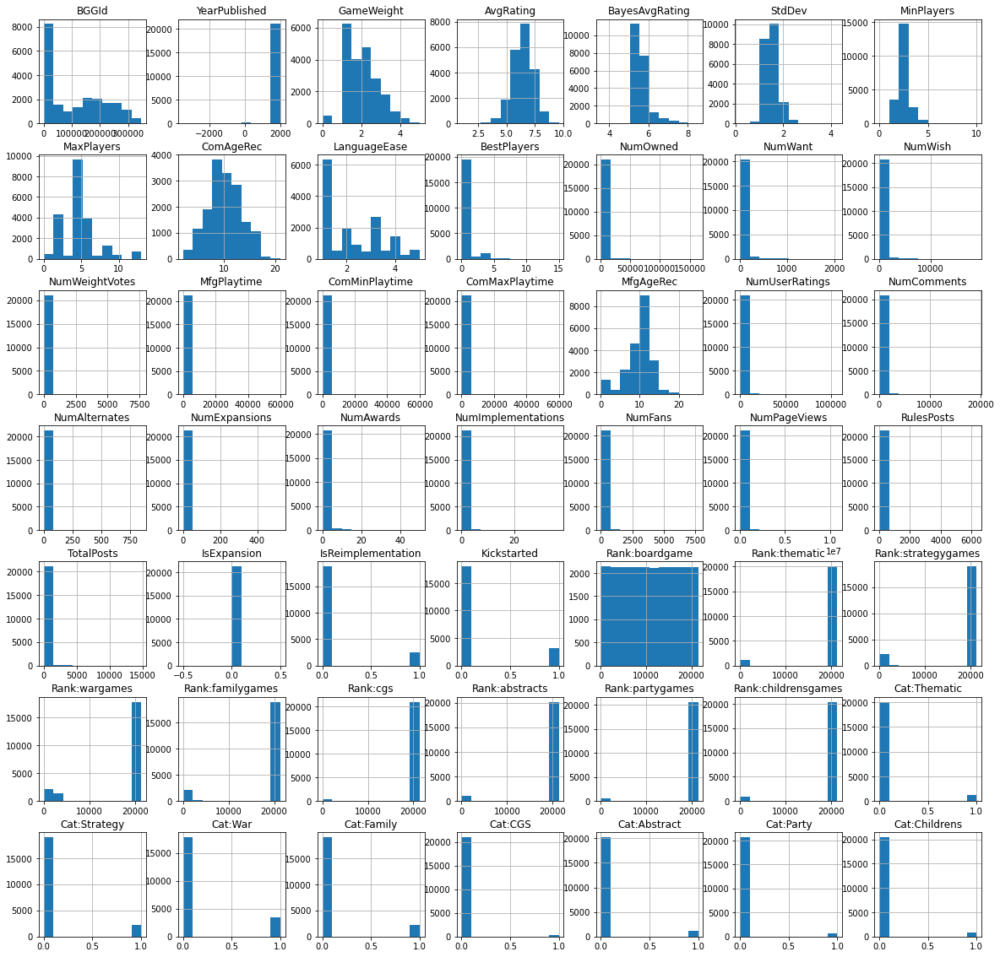

In [11]:
games.hist(figsize=(20,20));

In [12]:
# determine playtime for each game according to community
games['Playtime'] = 0
games['Playtime'] = games.apply(lambda x: np.mean(x['ComMinPlaytime'] + x['ComMaxPlaytime']), axis=1)

# set upper cap on playtime
over_6_hours = list(games.loc[games['Playtime']>360].index)
games.loc[over_6_hours, 'Playtime']=360

## Top 100, Top 1000, Top 5000 sets

##### All Games Top 100, Top 1000, and Top 5000

In [10]:
tenpercent = int(games.shape[0]*.1)
tenpercent

2136

In [11]:
# Make top 100, 500, 1000, 5000 games
games_100 = games.sort_values('Rank:boardgame', ascending=True)[:100]
games_500 = games.sort_values('Rank:boardgame', ascending=True)[:500]
games_1000 = games.sort_values('Rank:boardgame', ascending=True)[:1000]
games_5000 = games.sort_values('Rank:boardgame', ascending=True)[:5000]
games_tenpercent = games.sort_values('Rank:boardgame', ascending=True)[:tenpercent]

In [12]:
# Make top 100, 500, 1000, 5000 games
games_100_lean = games[['BGGId', 'Name', 'Rank:boardgame', 'AvgRating', 'BayesAvgRating']].sort_values('Rank:boardgame', ascending=True)[:100].set_index('BGGId')
games_500_lean = games[['BGGId', 'Name', 'Rank:boardgame', 'AvgRating', 'BayesAvgRating']].sort_values('Rank:boardgame', ascending=True)[:500].set_index('BGGId')
games_1000_lean = games[['BGGId', 'Name', 'Rank:boardgame', 'AvgRating', 'BayesAvgRating']].sort_values('Rank:boardgame', ascending=True)[:1000].set_index('BGGId')
games_5000_lean = games[['BGGId', 'Name', 'Rank:boardgame', 'AvgRating', 'BayesAvgRating']].sort_values('Rank:boardgame', ascending=True)[:5000].set_index('BGGId')
games_tenpercent_lean = games[['BGGId', 'Name', 'Rank:boardgame', 'AvgRating', 'BayesAvgRating']].sort_values('Rank:boardgame', ascending=True)[:tenpercent].set_index('BGGId')

##### Mechanics Top 100, Top 1000, and Top 5000

In [51]:
mechanics = pd.read_pickle('data_cleaned/mechanics.pkl')

In [14]:
mechs_100 = games_100_lean.join(mechanics.set_index('BGGId'), on='BGGId', how='left').reset_index()

mechs_500 = games_500_lean.join(mechanics.set_index('BGGId'), on='BGGId', how='left').reset_index()

mechs_1000 = games_1000_lean.join(mechanics.set_index('BGGId'), on='BGGId', how='left').reset_index()

mechs_5000 = games_5000_lean.join(mechanics.set_index('BGGId'), on='BGGId', how='left').reset_index()

mechs_tenpercent = games_tenpercent_lean.join(mechanics.set_index('BGGId'), on='BGGId', how='left').reset_index()

In [15]:
mechs_1000

,BGGId,Name,Rank:boardgame,AvgRating,BayesAvgRating,Action Queue,Action Retrieval,Campaign / Battle Card Driven,Card Play Conflict Resolution,Communication Limits,Cooperative Game,Critical Hits and Failures,Deck Construction,"Deck, Bag, and Pool Building",Grid Movement,Hand Management,Hexagon Grid,Legacy,Legacy Game,Modular Board,Once-Per-Game Abilities,Scenario / Mission / Campaign Game,Simultaneous Action Selection,Solo / Solitaire Game,Storytelling,Variable Player Powers,Action Points,Point to Point Movement,Set Collection,Trading,Income,Loans,Market,Network and Route Building,Score-and-Reset Game,Tech Trees / Tech Tracks,Turn Order: Stat-Based,Variable Set-up,Drafting,End Game Bonuses,TableauBuilding,Take That,Tile Placement,Turn Order: Progressive,Line of Sight,Action Drafting,Area Majority / Influence,Area-Impulse,Dice Rolling,Follow,King of the Hill,Variable Phase Order,Voting,Turn Order: Pass Order,Victory Points as a Resource,Area Movement,Delayed Purchase,Team-Based Game,Auction/Bidding,Auction: Dutch,Card Drafting,Events,Hidden Movement,Movement Points,Simulation,Ownership,Rondel,Track Movement,Action/Event,Advantage Token,Sudden Death Ending,Tug of War,Force Commitment,Narrative Choice / Paragraph,Grid Coverage,Worker Placement with Dice Workers,Layering,Increase Value of Unchosen Resources,Hidden Roles,Player Elimination,Semi-Cooperative Game,Traitor Game,Automatic Resource Growth,Push Your Luck,Worker Placement,Role Playing,Stat Check Resolution,Contracts,Turn Order: Auction,"Worker Placement, Different Worker Types",Race,Hidden Victory Points,Turn Order: Claim Action,Memory,Enclosure,Stock Holding,Pick-up and Deliver,Map Addition,Die Icon Resolution,Resource to Move,Turn Order: Role Order,Trick-taking,Move Through Deck,Bias,Auction: Turn Order Until Pass,Catch the Leader,Programmed Movement,Slide/Push,Commodity Speculation,Square Grid,Moving Multiple Units,Alliances,Kill Steal,Passed Action Token,Pattern Building,Investment,Secret Unit Deployment,Flicking,Highest-Lowest Scoring,Constrained Bidding,Mancala,Auction: Fixed Placement,Multiple-Lot Auction,Lose a Turn,Auction: Sealed Bid,Betting and Bluffing,Negotiation,Time Track,Connections,Targeted Clues,Order Counters,Bingo,Line Drawing,Paper-and-Pencil,Deduction,Movement Template,Selection Order Bid,Multiple Maps,Re-rolling and Locking,Roll / Spin and Move,Finale Ending,Roles with Asymmetric Information,Command Cards,"I Cut, You Choose",Prisoner's Dilemma,Interrupts,Real-Time,Ladder Climbing,Predictive Bid,Auction: Once Around,Closed Economy Auction,Three Dimensional Movement,Zone of Control,Random Production,Relative Movement,Cube Tower,Auction: English,Bribery,Map Deformation,Elapsed Real Time Ending,Melding and Splaying,Pieces as Map,Pattern Movement,Static Capture,Pattern Recognition,Minimap Resolution,Auction: Dutch Priority,Rock-Paper-Scissors,Map Reduction,Turn Order: Random,Acting,Singing,Ratio / Combat Results Table,Single Loser Game,Stacking and Balancing,Chaining,Different Dice Movement,Measurement Movement,Action Timer,Physical Removal,Induction,Hot Potato,Speed Matching,Player Judge,Crayon Rail System,Chit-Pull System,Matching,Auction: Dexterity,Impulse Movement
0,174430,Gloomhaven,1,8.76029,8.52385,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,161936,Pandemic Legacy: Season 1,2,8.60116,8.45000,0,0,0,0,0,1,0,0,0,0,1,0,1,1,0,0,0,0,0,0,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

##### Designers Top 100, Top 1000, and Top 5000

In [16]:
designers = pd.read_pickle('data/designers.pkl')

In [17]:
designers_100 = games_100_lean.join(designers.set_index('BGGId'), on='BGGId', how='left').reset_index()

designers_500 = games_500_lean.join(designers.set_index('BGGId'), on='BGGId', how='left').reset_index()

designers_1000 = games_1000_lean.join(designers.set_index('BGGId'), on='BGGId', how='left').reset_index()

designers_5000 = games_5000_lean.join(designers.set_index('BGGId'), on='BGGId', how='left').reset_index()

designers_tenpercent = games_tenpercent_lean.join(designers.set_index('BGGId'), on='BGGId', how='left').reset_index()

In [18]:
designers_1000

BGGId                          Name  Rank:boardgame  AvgRating  \
0    174430                    Gloomhaven               1    8.76029   
1    161936     Pandemic Legacy: Season 1               2    8.60116   
2    224517             Brass: Birmingham               3    8.66907   
3    167791             Terraforming Mars               4    8.42155   
4    291457  Gloomhaven: Jaws of the Lion               5    8.72198   
..      ...                           ...             ...        ...   
995     681                        Quarto             997    6.86205   
996  247236              Duelosaur Island             998    7.17142   
997   34084                  Witch's Brew             999    7.01293   
998  208024                 The Reckoners            1000    7.75306   
999  230933                        Merlin            1001    7.11932   

     BayesAvgRating  Isaac Childres  Matt Leacock  Rob Daviau  Gavan Brown  \
0           8.52385               1             0           0            0   
1           8.45000               0             1           1            0   
2           8.41066               0             0           0            1   
3           8.27751               0             0           0            0   
4           8.25902               1             0           0            0   
..              ...             ...           ...         ...          ...   
995         6.53918               0             0           0            0   
996         6.53871               0             0           0            0   
997         6.53863               0             0           0            0   
998         6.53855               0             0           0            0   
999         6.53849               0             0           0            0   

     Martin Wallace  Matt Tolman  Jacob Fryxelius  Christian T. Petersen  \
0                 0            0                0                      0   
1                 0            0                0                      0   
2                 1            1                0                      0   
3                 0            0                1                      0   
4                 0            0                0                      0   
..              ...          ...              ...                    ...   
995               0            0                0                      0   
996               0            0                0                      0   
997               0            0                0                      0   
998               0            0                0                      0   
999               0            0                0                      0   

     Corey Konieczka  Helge Ostertag  Jens Drögemüller  Vlaada Chvátil  \
0                  0               0                 0               0   
1                  0               0                 0               0   
2                  0               0                 0               0   
3                  0               0                 0               0   
4                  0               0                 0               0   
..               ...             ...               ...             ...   
995                0               0                 0               0   
996                0               0                 0               0   
997                0               0                 0               0   
998                0               0                 0               0   
999                0               0                 0               0   

     Francesco Nepitello  Marco Maggi  Roberto Di Meglio  R. Eric Reuss  \
0                      0            0                  0              0   
1                      0            0                  0              0   
2                      0            0                  0              0   
3                      0            0                  0              0   
4                      0   

##### Artists Top 100, Top 1000, and Top 5000

In [19]:
artists = pd.read_pickle('data/artists.pkl')

In [20]:
artists_100 = games_100_lean.join(artists.set_index('BGGId'), on='BGGId', how='left').reset_index()

artists_500 = games_500_lean.join(artists.set_index('BGGId'), on='BGGId', how='left').reset_index()

artists_1000 = games_1000_lean.join(artists.set_index('BGGId'), on='BGGId', how='left').reset_index()

artists_5000 = games_5000_lean.join(artists.set_index('BGGId'), on='BGGId', how='left').reset_index()

artists_tenpercent = games_tenpercent_lean.join(artists.set_index('BGGId'), on='BGGId', how='left').reset_index()

In [21]:
artists_1000

BGGId                          Name  Rank:boardgame  AvgRating  \
0    174430                    Gloomhaven               1    8.76029   
1    161936     Pandemic Legacy: Season 1               2    8.60116   
2    224517             Brass: Birmingham               3    8.66907   
3    167791             Terraforming Mars               4    8.42155   
4    291457  Gloomhaven: Jaws of the Lion               5    8.72198   
..      ...                           ...             ...        ...   
995     681                        Quarto             997    6.86205   
996  247236              Duelosaur Island             998    7.17142   
997   34084                  Witch's Brew             999    7.01293   
998  208024                 The Reckoners            1000    7.75306   
999  230933                        Merlin            1001    7.11932   

     BayesAvgRating  Alexandr Elichev  Josh T. McDowell  Chris Quilliams  \
0           8.52385                 1                 1                0   
1           8.45000                 0                 0                1   
2           8.41066                 0                 0                0   
3           8.27751                 0                 0                0   
4           8.25902                 1                 0                0   
..              ...               ...               ...              ...   
995         6.53918                 0                 0                0   
996         6.53871                 0                 0                0   
997         6.53863                 0                 0                0   
998         6.53855                 0                 0                0   
999         6.53849                 0                 0                0   

     Damien Mammoliti  David Forest  Lina Cossette  Isaac Fryxelius  \
0                   0             0              0                0   
1                   0             0              0                0   
2                   1             1              1                0   
3                   0             0              0                1   
4                   0             0              0                0   
..                ...           ...            ...              ...   
995                 0             0              0                0   
996                 0             0              0                0   
997                 0             0              0                0   
998                 0             0              0                0   
999                 0             0              0                0   

     David Demaret  Francesca Baerald  Scott Schomburg  Dennis Lohausen  \
0                0                  0                0                0   
1                0                  0                0                0   
2                0                  0                0                0   
3                0                  0                0                0   
4                1                  1                0                0   
..             ...                ...              ...              ...   
995              0                  0                0                0   
996              0                  0                0                0   
997              0                  0                0                0   
998              0                  0                0                0   
999              0                  0                0                1   

     Adam Burn  Adam Lane  Alexandre Dainche  Alexandru Sabo  Allen Douglas  \
0            0          0                  0               0              0   
1            0          0                  0               0              0   
2            0          0                  0               0              0   
3            0          0                  0               0              0   
4            0          0                  0               0              0   


##### Publishers Top 100, Top 1000, and Top 5000

In [22]:
publishers = pd.read_pickle('data/publishers.pkl')

In [23]:
publishers_100 = games_100_lean.join(publishers.set_index('BGGId'), on='BGGId', how='left').reset_index()

publishers_500 = games_500_lean.join(publishers.set_index('BGGId'), on='BGGId', how='left').reset_index()

publishers_1000 = games_1000_lean.join(publishers.set_index('BGGId'), on='BGGId', how='left').reset_index()

publishers_5000 = games_5000_lean.join(publishers.set_index('BGGId'), on='BGGId', how='left').reset_index()

publishers_tenpercent = games_tenpercent_lean.join(publishers.set_index('BGGId'), on='BGGId', how='left').reset_index()

In [24]:
publishers_1000

BGGId                          Name  Rank:boardgame  AvgRating  \
0    174430                    Gloomhaven               1    8.76029   
1    161936     Pandemic Legacy: Season 1               2    8.60116   
2    224517             Brass: Birmingham               3    8.66907   
3    167791             Terraforming Mars               4    8.42155   
4    291457  Gloomhaven: Jaws of the Lion               5    8.72198   
..      ...                           ...             ...        ...   
995     681                        Quarto             997    6.86205   
996  247236              Duelosaur Island             998    7.17142   
997   34084                  Witch's Brew             999    7.01293   
998  208024                 The Reckoners            1000    7.75306   
999  230933                        Merlin            1001    7.11932   

     BayesAvgRating  Albi  Albi Polska  Arclight  Asmodee  Cephalofair Games  \
0           8.52385     1            1         1        1                  1   
1           8.45000     0            0         0        0                  0   
2           8.41066     0            0         1        0                  0   
3           8.27751     0            0         1        0                  0   
4           8.25902     1            1         0        1                  1   
..              ...   ...          ...       ...      ...                ...   
995         6.53918     0            0         0        0                  0   
996         6.53871     0            0         0        1                  0   
997         6.53863     0            0         0        0                  0   
998         6.53855     0            0         0        0                  0   
999         6.53849     0            0         0        0                  0   

     Feuerland Spiele  Galápagos Jogos  Games Warehouse  Gém Klub Kft.  \
0                   1                1                1              1   
1                   0                0                0              1   
2                   0                0                0              1   
3                   0                0                0              0   
4                   1                0                0              0   
..                ...              ...              ...            ...   
995                 0                0                0              0   
996                 0                0                0              0   
997                 0                0                0              0   
998                 0                0                0              0   
999                 0                0                0              0   

     Hobby World  Korea Boardgames Co., Ltd.  MYBG Co., Ltd.  Asterion Press  \
0              1                           1               1               0   
1              0                           1               0               1   
2              0                           0               0               0   
3              0                           1               1               0   
4              1                           1               0               0   
..           ...                         ...             ...             ...   
995            0                           1               0               0   
996            0                           0               0               0   
997            0                           0               0               0   
998            0                           0               0               0   
999            0                           0               0               0   

     Devir  Filosofia Éditions  Hobby Japan  Jolly Thinkers  Lacerta  \
0        0                   0            0               0        0   
1        1                   1            1               1        1   
2        0                   0            0               0        0   
3        0                   0            

##### Awards Top 100, Top 1000, and Top 5000

In [25]:
awards = pd.read_pickle('data/awards.pkl')

In [26]:
awards_100 = games_100_lean.join(awards.set_index('BGGId'), on='BGGId', how='left').reset_index()

awards_500 = games_500_lean.join(awards.set_index('BGGId'), on='BGGId', how='left').reset_index()

awards_1000 = games_1000_lean.join(awards.set_index('BGGId'), on='BGGId', how='left').reset_index()

awards_5000 = games_5000_lean.join(awards.set_index('BGGId'), on='BGGId', how='left').reset_index()

awards_tenpercent = games_tenpercent_lean.join(awards.set_index('BGGId'), on='BGGId', how='left').reset_index()

In [27]:
awards_1000

BGGId                          Name  Rank:boardgame  AvgRating  \
0    174430                    Gloomhaven               1    8.76029   
1    161936     Pandemic Legacy: Season 1               2    8.60116   
2    224517             Brass: Birmingham               3    8.66907   
3    167791             Terraforming Mars               4    8.42155   
4    291457  Gloomhaven: Jaws of the Lion               5    8.72198   
..      ...                           ...             ...        ...   
995     681                        Quarto             997    6.86205   
996  247236              Duelosaur Island             998    7.17142   
997   34084                  Witch's Brew             999    7.01293   
998  208024                 The Reckoners            1000    7.75306   
999  230933                        Merlin            1001    7.11932   

     BayesAvgRating  As d'Or - Jeu de l'Année Expert Nominee  \
0           8.52385                                        1   
1           8.45000                                        1   
2           8.41066                                        0   
3           8.27751                                        1   
4           8.25902                                        0   
..              ...                                      ...   
995         6.53918                                        0   
996         6.53871                                        0   
997         6.53863                                        0   
998         6.53855                                        0   
999         6.53849                                        0   

     Best Science Fiction or Fantasy Board Game Nominee  \
0                                                    1    
1                                                    0    
2                                                    0    
3                                                    1    
4                                                    0    
..                                                 ...    
995                                                  0    
996                                                  0    
997                                                  0    
998                                                  0    
999                                                  0    

     Board Game Quest Awards Best Coop Game Nominee  \
0                                                 1   
1                                                 1   
2                                                 0   
3                                                 0   
4                                                 0   
..                                              ...   
995                                               0   
996                                               0   
997                                               0   
998                                               1   
999                                               0   

     Board Game Quest Awards Best Thematic Game Nominee  \
0                                                    1    
1                                                    0    
2                                                    0    
3                                                    0    
4                                                    0    
..                                                 ...    
995                                                  0    
996                                                  0    
997                                                  0    
998                                                  0    
999                                                  0    

     Cardboard Republic Striker Laurel Nominee  \
0                                            1   
1                                            0   
2                                            0   
3                                            0   
4                                          

##### Categories Top 100, Top 1000, and Top 5000

In [28]:
categories = pd.read_pickle('data/categories.pkl')

In [29]:
categories_100 = games_100_lean.join(categories.set_index('BGGId'), on='BGGId', how='left').reset_index()

categories_500 = games_500_lean.join(categories.set_index('BGGId'), on='BGGId', how='left').reset_index()

categories_1000 = games_1000_lean.join(categories.set_index('BGGId'), on='BGGId', how='left').reset_index()

categories_5000 = games_5000_lean.join(categories.set_index('BGGId'), on='BGGId', how='left').reset_index()

categories_tenpercent = games_tenpercent_lean.join(categories.set_index('BGGId'), on='BGGId', how='left').reset_index()

In [30]:
categories_1000

,BGGId,Name,Rank:boardgame,AvgRating,BayesAvgRating,Adventure,Exploration,Fantasy,Fighting,Miniatures,Environmental,Medical,Economic,Industry / Manufacturing,Transportation,Science Fiction,Space Exploration,Territory Building,Civilization,Negotiation,Political,Wargame,Civil War,Movies / TV / Radio theme,Card Game,Novel-based,Age of Reason,Mythology,Renaissance,American West,Animals,Modern Warfare,Dice,Medieval,Ancient,City Building,Nautical,Post-Napoleonic,Horror,Educational,Puzzle,Collectible Components,Farming,Religious,Travel,Murder/Mystery,Pirates,Comic Book / Strip,Mature / Adult,Video Game Theme,Spies/Secret Agents,Abstract Strategy,Bluffing,Action / Dexterity,Arabian,Prehistoric,Deduction,Trains,Party Game,Word Game,Aviation / Flight,Zombies,World War II,Pike and Shot,World War I,Real-time,Humor,Print & Play,Racing,Sports,Electronic,Maze,Mafia,Expansion for Base-game,American Indian Wars,Napoleonic,American Revolutionary War,Children's Game,Memory,Vietnam War,American Civil War,Math,Number,Trivia,Music,Korean War,Game System,Book
0,174430,Gloomhaven,1,8.76029,8.52385,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,161936,Pandemic Legacy: Season 1,2,8.60116,8.45000,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,224517,Brass: Birmingham,3,8.66907,8.41066,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,167791,Terraforming Mars,4,8.42155,8.27751,0,0,0,0,0,1,0,1,1,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,291457,Gloomhaven: Jaws of the Lion,5,8.72198,8.25902,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,681,Quarto,997,6.86205,6.53918,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
996,247236,Duelosaur Island,998,7.17142,6.53871,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
997,34084,Witch's Brew,999,7.01293,6.53863,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
998,208024,The Reckoners,1000,7.75306,6.53855,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


##### Ratings Distribution Top 100, Top 1000, and Top 5000

In [31]:
ratings_dist = pd.read_pickle('data/ratings_dist.pkl')

In [32]:
ratings_dist

,1,10,2,3,4,5,6,7,8,9,num_votes,BGGId
0,445,20000,227,337,394,705,1800,2900,7700,11000,46228,174430
1,445,15000,200,252,319,572,1700,3300,9900,13000,44043,161936
2,66,6800,34,75,117,213,681,1700,6500,7700,23776,224517
3,187,17000,145,359,626,1200,3600,7300,21000,21000,71474,167791
4,106,4800,41,50,77,144,409,916,3100,4300,13939,291457
...,...,...,...,...,...,...,...,...,...,...,...,...
21360,575,16,355,204,143,54,24,15,6,1,1392,16398
21361,619,16,481,433,342,201,109,40,14,6,2257,7316
21362,717,38,891,957,858,411,174,84,43,13,4178,5048
21363,1,9,926,998,780,679,335,147,56,33,3967,5432


In [33]:
ratings_100 = games_100_lean.join(ratings_dist.set_index('BGGId'), on='BGGId', how='left').reset_index()

ratings_500 = games_500_lean.join(ratings_dist.set_index('BGGId'), on='BGGId', how='left').reset_index()

ratings_1000 = games_1000_lean.join(ratings_dist.set_index('BGGId'), on='BGGId', how='left').reset_index()

ratings_5000 = games_5000_lean.join(ratings_dist.set_index('BGGId'), on='BGGId', how='left').reset_index()

ratings_tenpercent = games_tenpercent_lean.join(ratings_dist.set_index('BGGId'), on='BGGId', how='left').reset_index()

In [34]:
ratings_1000

,BGGId,Name,Rank:boardgame,AvgRating,BayesAvgRating,1,10,2,3,4,5,6,7,8,9,num_votes
0,174430,Gloomhaven,1,8.76029,8.52385,445,20000,227,337,394,705,1800,2900,7700,11000,46228
1,161936,Pandemic Legacy: Season 1,2,8.60116,8.45000,445,15000,200,252,319,572,1700,3300,9900,13000,44043
2,224517,Brass: Birmingham,3,8.66907,8.41066,66,6800,34,75,117,213,681,1700,6500,7700,23776
3,167791,Terraforming Mars,4,8.42155,8.27751,187,17000,145,359,626,1200,3600,7300,21000,21000,71474
4,291457,Gloomhaven: Jaws of the Lion,5,8.72198,8.25902,106,4800,41,50,77,144,409,916,3100,4300,13939
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,681,Quarto,997,6.86205,6.53918,5,203,20,63,181,525,1600,1900,1300,385,6210
996,247236,Duelosaur Island,998,7.17142,6.53871,4,74,9,25,55,132,502,859,965,214,2837
997,34084,Witch's Brew,999,7.01293,6.53863,8,59,11,30,87,204,766,1200,1100,221,3692
998,208024,The Reckoners,1000,7.75306,6.53855,3,133,7,8,24,42,138,324,611,274,1562


## Questions Repository

#### Recency Bias

In [119]:
past1970 = games.loc[(games['YearPublished']>=1970) & (games['YearPublished']<=2021)]

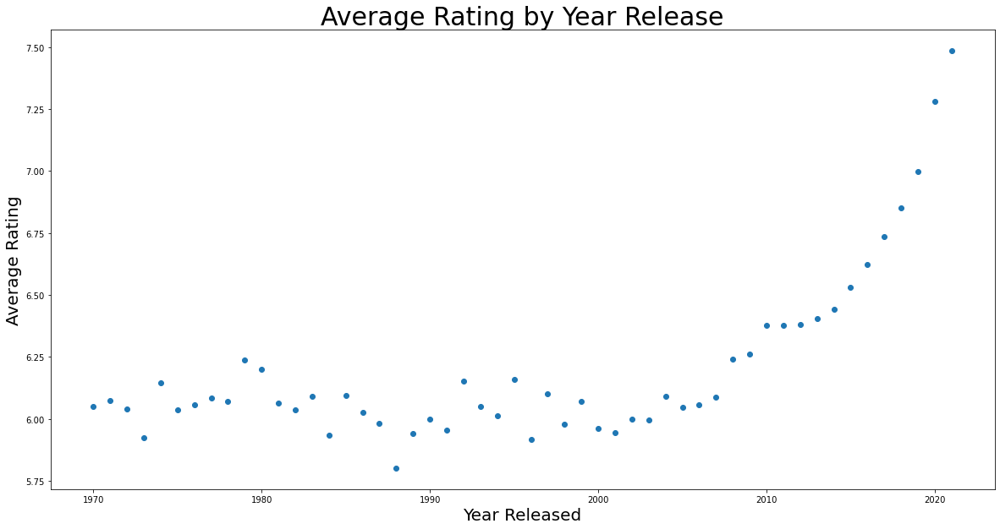

In [186]:
x_years = sorted(past1970['YearPublished'].unique())
y_averages = past1970.groupby('YearPublished')['AvgRating'].mean()

fix, ax= plt.subplots(figsize=(20,10))
plt.scatter(x_years, y_averages)

plt.title("Average Rating by Year Release", fontsize=30)
plt.xlabel("Year Released", fontsize=20)
plt.ylabel("Average Rating", fontsize=20)
plt.savefig('recency_bias.png');

In [121]:
past1970['bias_adj_rating'] = past1970['AvgRating'] - past1970.groupby('YearPublished')['AvgRating'].transform('mean')

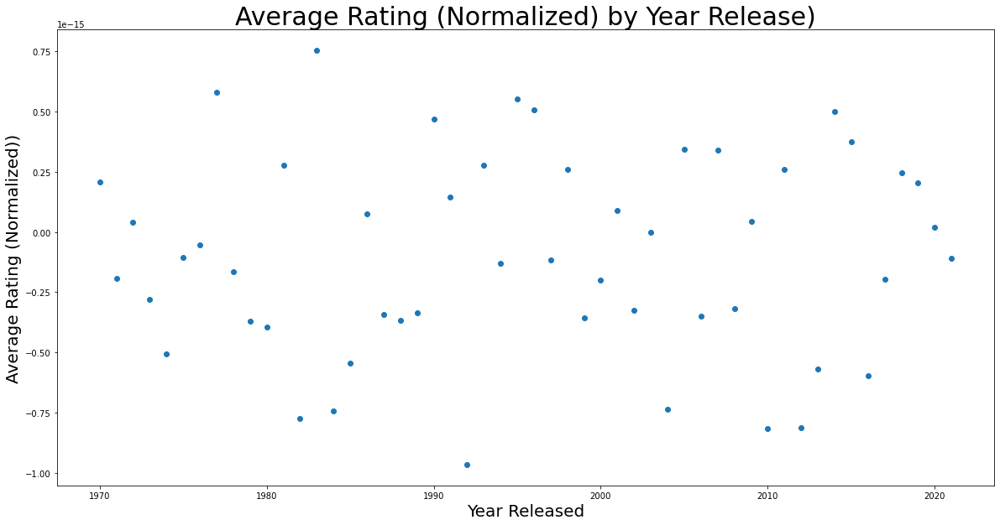

In [187]:
x_years = sorted(past1970['YearPublished'].unique())
y_averages = past1970.groupby('YearPublished')['bias_adj_rating'].mean()

fix, ax= plt.subplots(figsize=(20,10))
plt.scatter(x_years, y_averages)

plt.title("Average Rating (Normalized) by Year Release)", fontsize=30)
plt.xlabel("Year Released", fontsize=20)
plt.ylabel("Average Rating (Normalized))", fontsize=20)
plt.savefig('recency_bias_normalized.png');

#### User engagement time

In [126]:
def clean_ratings(id_num):
    '''Takes in a "dirty" rating file, cleans to proper data formats and returns'''
    
    print('\nCleaning Frame #'+str(id_num))
    
    #load in raw users file
    users = pd.read_pickle('data_dirty/ratings_dates'+str(id_num)+'.pkl')
    
    # convert all datatypes to float
    users['BGGId'] = users['BGGId'].astype('int32')
    users['Rating'] = users['Rating'].astype('float')
    users['Date_rated'] = pd.to_datetime(users['Date_rated']).dt.date
    users['Date_rated'] = pd.to_datetime(users['Date_rated'])
    
    # return cleaned file
    return users

In [127]:
def create_ratings_file(num_files):
    '''Loads incremental file numbers, cleans each file, appends to dataframe. Returns compiled dataframe'''
    
    master_file = pd.DataFrame()
    
    num_files=num_files
    
    for id_num in np.arange(1,num_files+1,1):    
        cleaned_item = clean_ratings(id_num)
        master_file = pd.concat([master_file, cleaned_item], axis=0)
       
    return master_file

In [140]:
# Clean the files

user_ratings_date = create_ratings_file(19)


Cleaning Frame #1

Cleaning Frame #2

Cleaning Frame #3

Cleaning Frame #4

Cleaning Frame #5

Cleaning Frame #6

Cleaning Frame #7

Cleaning Frame #8

Cleaning Frame #9

Cleaning Frame #10

Cleaning Frame #11

Cleaning Frame #12

Cleaning Frame #13

Cleaning Frame #14

Cleaning Frame #15

Cleaning Frame #16

Cleaning Frame #17

Cleaning Frame #18

Cleaning Frame #19


In [179]:
# check ratings file

user_ratings_date

,Username,BGGId,Rating,Date_rated
0,Fu_Koios,223033,9.0,2017-10-05
1,Fu_Koios,112092,9.0,2013-01-25
0,-DE-,21241,10.0,2006-07-14
0,-Johnny-,7865,3.0,2010-11-28
1,-Johnny-,30363,3.0,2010-03-06
...,...,...,...,...
336,MattyTh,13681,5.0,2013-12-05
337,MattyTh,2393,7.0,2016-04-16
338,MattyTh,145277,6.0,2015-04-30
339,MattyTh,528,8.0,2016-01-26


In [180]:
# get total ratings per user
total_votes = pd.DataFrame(user_ratings_date.groupby('Username').sum())

# get index of users with fewer than 30 ratings
low_votes = total_votes.loc[(total_votes['Rating']<30)].index

# make min rating dataframe with users who have min number ratings
user_ratings_min = user_ratings_date[~user_ratings_date.Username.isin(low_votes)]
user_ratings_min

# get ratings average per user
avg_ratings = pd.DataFrame(user_ratings_min.groupby('Username').mean().sort_values('Rating'))

# get index of users who leave all 1s or all 10s
all_10s_or_1s = avg_ratings.loc[(avg_ratings['Rating']==10) | (avg_ratings['Rating']==1)].index

# make cleaned user rating dataframe with users who don't rate all 1 or all 10
user_ratings_cleaned = user_ratings_min[~user_ratings_min['Username'].isin(all_10s_or_1s)]

del user_ratings_date
gc.collect()

user_ratings_cleaned

171

In [184]:
# prepare df for user's earliest interaction
user_ratings_earliest = pd.DataFrame()

# record each user's earliest interaction
user_ratings_earliest['Earliest_date_rated'] = user_ratings_cleaned.groupby('Username')['Date_rated'].min()

# record each user's average rating
user_ratings_earliest['Avg_Rating'] = user_ratings_cleaned.groupby('Username')['Rating'].mean()

# display sorting by earliest recorded date
user_ratings_earliest.sort_values('Avg_Rating')

,Earliest_date_rated,Avg_Rating
Username,,
Marcius985,2019-04-25,1.988636
Chino27,2017-05-12,2.210526
GrauGeist,2017-11-04,2.328947
Jigili,2019-10-26,2.367347
Harry Bumnapper,2018-05-29,2.575758
...,...,...
EDGE1980,2018-11-15,9.987792
BoardGamer2008,2011-11-20,9.988342
Isjohn,2018-10-05,9.990000


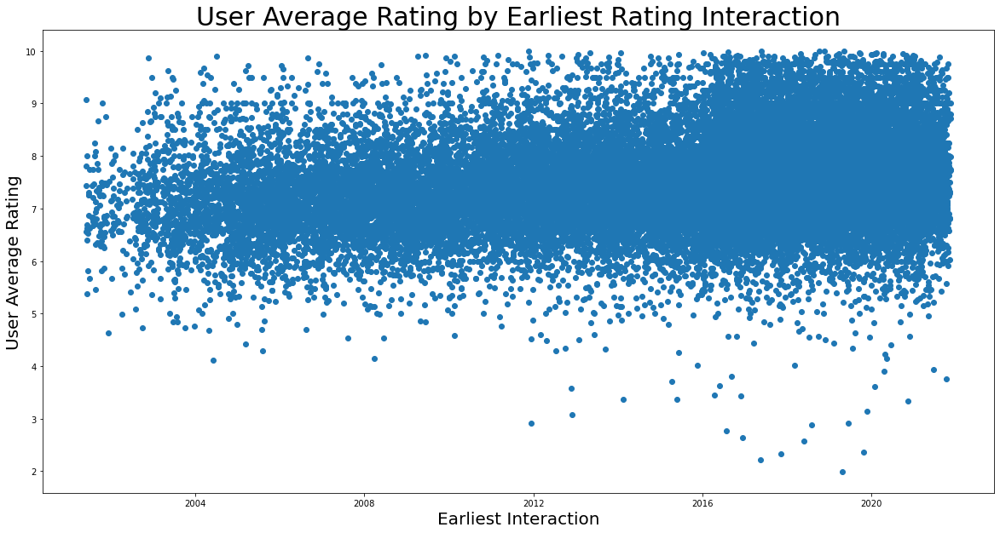

In [188]:
# plot earliest recorded date and average user rating

fig, ax = plt.subplots(figsize=(20,10))

plt.scatter(user_ratings_earliest['Earliest_date_rated'], user_ratings_earliest['Avg_Rating'])

plt.title("User Average Rating by Earliest Rating Interaction", fontsize=30)
plt.xlabel("Earliest Interaction", fontsize=20)
plt.ylabel("User Average Rating", fontsize=20)
plt.savefig('user_avg_by_earliest.png');

Users who first engaged after 2016 were more likely to rate higher AND lower

In [213]:
user_ratings_cleaned['Year_interacted'] = user_ratings_cleaned['Date_rated'].dt.year
user_ratings_cleaned

,Username,BGGId,Rating,Date_rated,Normalized,Year_interacted
0,-Johnny-,7865,3.0,2010-11-28,-2.318786,2010
1,-Johnny-,30363,3.0,2010-03-06,-2.318786,2010
2,-Johnny-,22278,5.0,2009-12-20,-0.318786,2009
3,-Johnny-,94246,8.0,2012-05-28,2.681214,2012
4,-Johnny-,421,4.0,2009-04-30,-1.318786,2009
...,...,...,...,...,...,...
336,MattyTh,13681,5.0,2013-12-05,-1.620968,2013
337,MattyTh,2393,7.0,2016-04-16,0.379032,2016
338,MattyTh,145277,6.0,2015-04-30,-0.620968,2015
339,MattyTh,528,8.0,2016-01-26,1.379032,2016


In [217]:
user_ratings_cleaned.groupby('Year_interacted').mean()

,BGGId,Rating,Normalized
Year_interacted,,,
2001,830.025253,6.419054,-0.195971
2002,1357.602848,6.417337,-0.177798
2003,1983.663286,6.509464,-0.198555
2004,3113.823278,6.493550,-0.198681
2005,4652.972581,6.479403,-0.196189
2006,6670.467871,6.549665,-0.135487
2007,8962.995255,6.650591,-0.135918
2008,11736.948772,6.608755,-0.185882
2009,14598.617629,6.604030,-0.195909


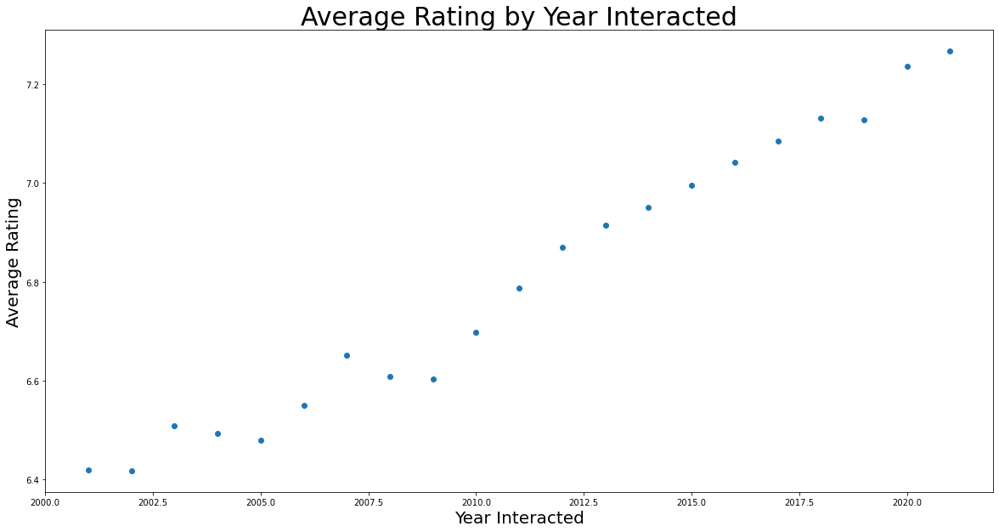

In [219]:
fig, ax = plt.subplots(figsize=(20,10))

plt.scatter(user_ratings_cleaned.groupby('Year_interacted').mean().index, user_ratings_cleaned.groupby('Year_interacted')['Rating'].mean())

plt.title("Average Rating by Year Interacted", fontsize=30)
plt.xlabel("Year Interacted", fontsize=20)
plt.ylabel("Average Rating", fontsize=20)
plt.savefig('user_avg_by_year.png');

In [190]:
# now we will try normalizing,

# make a dictionary of the user's average rating
user_averages = pd.DataFrame(user_ratings_cleaned.groupby('Username')['Rating'].mean()).to_dict(orient = 'index')

# function to normalize the rating per row
def normalize_user(x, user_averages):
    username = x['Username']
    normalized = x['Rating'] - user_averages[username]['Rating']
    return normalized

In [191]:
# normalize each rating
user_ratings_cleaned['Normalized'] = user_ratings_cleaned.apply(lambda x: normalize_user(x, user_averages), axis=1)

In [192]:
user_ratings_cleaned

,Username,BGGId,Rating,Date_rated,Normalized
0,-Johnny-,7865,3.0,2010-11-28,-2.318786
1,-Johnny-,30363,3.0,2010-03-06,-2.318786
2,-Johnny-,22278,5.0,2009-12-20,-0.318786
3,-Johnny-,94246,8.0,2012-05-28,2.681214
4,-Johnny-,421,4.0,2009-04-30,-1.318786
...,...,...,...,...,...
336,MattyTh,13681,5.0,2013-12-05,-1.620968
337,MattyTh,2393,7.0,2016-04-16,0.379032
338,MattyTh,145277,6.0,2015-04-30,-0.620968
339,MattyTh,528,8.0,2016-01-26,1.379032


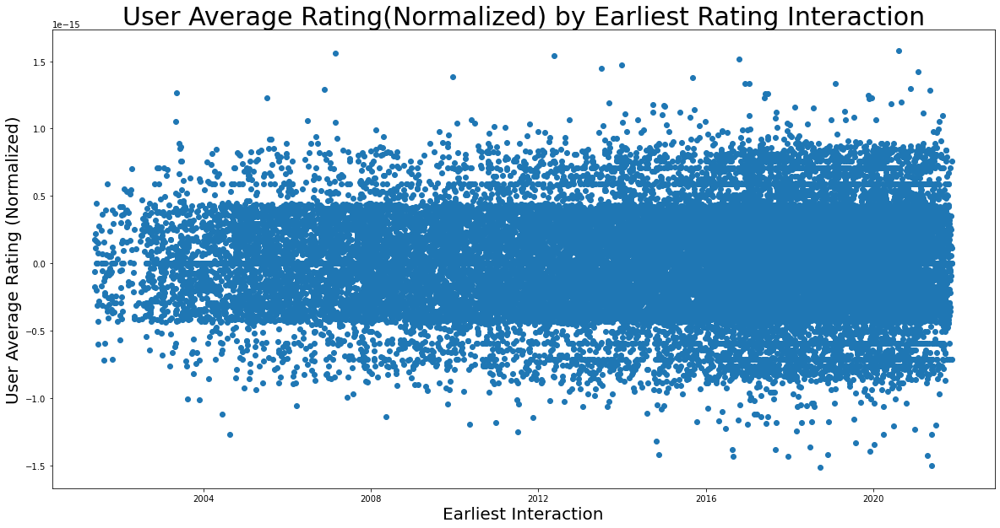

In [193]:
# plot the normalized ratings

user_ratings_earliest_norm = pd.DataFrame()
user_ratings_earliest_norm['Earliest_date_rated'] = user_ratings_cleaned.groupby('Username')['Date_rated'].min()
user_ratings_earliest_norm['Normed_Rating'] = user_ratings_cleaned.groupby('Username')['Normalized'].mean()

fig, ax = plt.subplots(figsize=(20,10))

plt.scatter(user_ratings_earliest_norm['Earliest_date_rated'], user_ratings_earliest_norm['Normed_Rating'])

plt.title("User Average Rating(Normalized) by Earliest Rating Interaction", fontsize=30)
plt.xlabel("Earliest Interaction", fontsize=20)
plt.ylabel("User Average Rating (Normalized)", fontsize=20)
plt.savefig('user_avg_by_earliest_normed.png');

User add per year - check user increases

check ratings by year published for the commenting cohort - controlling by their average rating

#### Distribution of Specific Users

In [194]:
users_totalrating_earliest = pd.DataFrame()
users_totalrating_earliest['Username'] = list(user_ratings_cleaned.groupby('Username')['Rating'].sum().index)
users_totalrating_earliest['Earliest_year'] = list(user_ratings_cleaned.groupby('Username')['Date_rated'].min().dt.year)
users_totalrating_earliest['Num_ratings'] = list(user_ratings_cleaned.groupby('Username')['Rating'].sum())
users_totalrating_earliest

,Username,Earliest_year,Num_ratings
0,-Johnny-,2004,2803.00
1,-LucaS-,2003,177.50
2,-Morphling-,2020,402.00
3,-mIDE-,2007,4413.50
4,-snarf-,2004,109.00
...,...,...,...
33724,Myhowdy,2013,3388.35
33725,Mykeul,2001,1323.00
33726,Mynyster,2018,59.00
33727,Myok,2009,1626.00


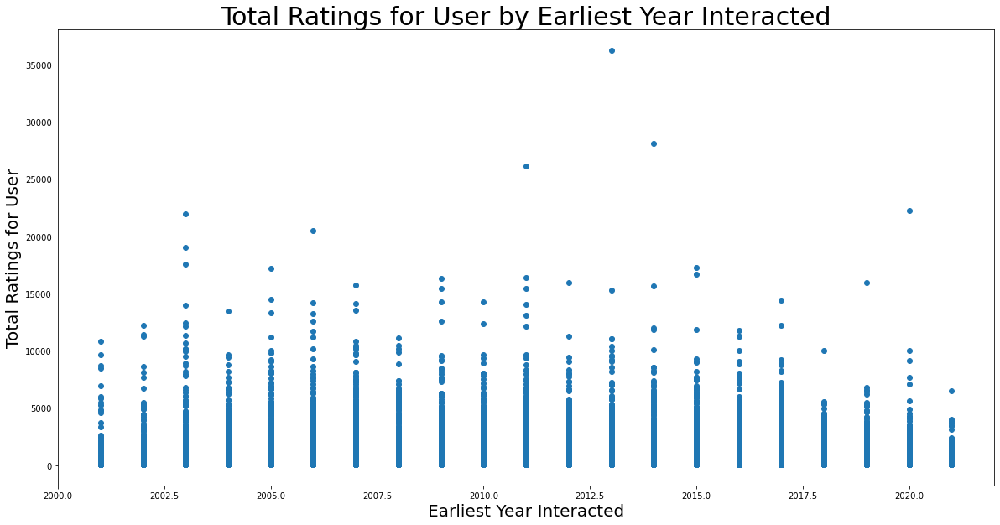

In [221]:
fig, ax = plt.subplots(figsize=(20,10))

plt.scatter(users_totalrating_earliest['Earliest_year'], users_totalrating_earliest['Num_ratings'])

plt.title("Total Ratings for User by Earliest Year Interacted", fontsize=30)
plt.xlabel("Earliest Year Interacted", fontsize=20)
plt.ylabel("Total Ratings for User", fontsize=20)
plt.savefig('user_sum_by_earliest.png');

##### Rules Clarity
% of rules posts to total posts - lower % for high weight games have good rules clarity ?

##### Mechanic Bigrams and Trigrams in top 100

##### Designers with declining ratings per time

##### Designers with improving ratings for time

##### Most confusing rules

##### Ratings polarization on kickstarters

##### Top 100 euros vs more thematic

##### what publisher with more than three games published has the highest average rating across all their games

##### Are popular designers the best designers?

##### Top 100 Euros vs Thematic

##### What designer with more than three games pulished has the highest average rating across all their games?

##### Are the most popular designers (games in the top x00) the best designers (best overall average ratings)?

##### Sentiment analysis on reviews - what score is actually a very poor, poor, neutral, good, very good review?

##### How far does the mfg play time deviate from the community play time, depending on game weight?

##### Party games study

##### How does mfg rec age relate to actual rec age

##### Regress game weight against ranking

##### Regress game designers against ranking

##### Ratings of games within their family

##### Take a game, throw out a similar game (find x mechanics that match?)

#### Ratings Distributions

In [ ]:
games_100['AvgRating'].hist(bins=20)
games_100['BayesAvgRating'].hist(bins=20, color='lightblue', alpha=.5);
this_avg = round(games_100['AvgRating'].mean(), 3)
bayes_avg = round(games_100['BayesAvgRating'].mean(), 3)

print("Unweighted Average: ",this_avg, "\nWeighted Average: ",bayes_avg)

In [ ]:
games_500['AvgRating'].hist(bins=20)
games_500['BayesAvgRating'].hist(bins=20, color='lightblue', alpha=.5);
this_avg = round(games_500['AvgRating'].mean(), 3)
bayes_avg = round(games_500['BayesAvgRating'].mean(), 3)

print("Unweighted Average: ",this_avg, "\nWeighted Average: ",bayes_avg)

In [ ]:
games_1000['AvgRating'].hist(bins=20)
games_1000['BayesAvgRating'].hist(bins=20, color='lightblue', alpha=.5);
this_avg = round(games_1000['AvgRating'].mean(), 3)
bayes_avg = round(games_1000['BayesAvgRating'].mean(), 3)

print("Unweighted Average: ",this_avg, "\nWeighted Average: ",bayes_avg)

In [ ]:
games_tenpercent['AvgRating'].hist(bins=20)
games_tenpercent['BayesAvgRating'].hist(bins=20, color='lightblue', alpha=.5);
this_avg = round(games_tenpercent['AvgRating'].mean(), 3)
bayes_avg = round(games_tenpercent['BayesAvgRating'].mean(), 3)

print("Unweighted Average: ",this_avg, "\nWeighted Average: ",bayes_avg)

In [ ]:
games_5000['AvgRating'].hist(bins=20)
games_5000['BayesAvgRating'].hist(bins=20, color='lightblue', alpha=.5);
this_avg = round(games_5000['AvgRating'].mean(), 3)
bayes_avg = round(games_5000['BayesAvgRating'].mean(), 3)

print("Unweighted Average: ",this_avg, "\nWeighted Average: ",bayes_avg)

In [ ]:

games['AvgRating'].hist(bins=20)
games['BayesAvgRating'].hist(bins=20, color='lightblue', alpha=.5);

this_avg = round(games['AvgRating'].mean(), 3)
bayes_avg = round(games['BayesAvgRating'].mean(), 3)

print("Unweighted Average: ",this_avg, "\nWeighted Average: ",bayes_avg)

#### Most voted for games

In [ ]:
# Show Name, YearPublished, NumUserRatings, AvgRating, Rank for top 20 games sorted by NumUserRatings

games.sort_values('NumUserRatings', ascending=False).head(20)[['Name', 'YearPublished', 'NumUserRatings', 'AvgRating', 'Rank:boardgame']].set_index('Name', drop=True)

#### Gaming's "Best Year"

Year sorted by average rating for games published after 1970.

The kickstarter recency bias is wildly apparent. The best years haven't even happened.

In [ ]:
# Sort on best year for modern games after 1970 by raw rating

games.loc[(games['YearPublished']>1970)].groupby('YearPublished')['AvgRating'].mean().sort_values(ascending=False).head(10)

Year sorted by average rating for Top 1000 games published after 1970.

When we filter to only the top 1000, we can get rid of a lot of the recency bias and get a better look at the "Good years". But, we'll refine this further shortly.

In [ ]:
# Sort on top 1000 modern games published after 1970 on raw rating

games.loc[(games['YearPublished']>1970)][:1000].groupby('YearPublished')['AvgRating'].mean().sort_values(ascending=False).head(10)

If we sort on the biased weights for modern games, we get a stronger picture. But MORE and MORE games are being produced each year, meaning the market is getting an influx of both good AND bad games each year. This still doesn't quite tell us which modern years are producing the best games.

In [ ]:
games.loc[(games['YearPublished']>1970)].groupby('YearPublished')['BayesAvgRating'].mean().sort_values(ascending=False).head(10)

With that, we sort modern gaming using only the top 1000. Here we get a strong picture of modern gaming's best years.

In [ ]:
games.loc[(games['YearPublished']>1970)][:1000].groupby('YearPublished')['BayesAvgRating'].mean().sort_values(ascending=False).head(10)

Modern gaming in the top 10%

In [ ]:
games.loc[(games['YearPublished']>1970)][:tenpercent].groupby('YearPublished')['BayesAvgRating'].mean().sort_values(ascending=False).head(10)

#### Gaming's Best Year - No KS

Did KS pull ratings up or down?

In [ ]:
# get games in top 1000 that were not kickstarted
not_kickstarted = games[:1000].loc[games['Kickstarted']==0]

# modern games >1970 group by weighted rating
not_kickstarted.loc[(not_kickstarted['YearPublished']>1970)][:1000].groupby('YearPublished')['BayesAvgRating'].mean().sort_values(ascending=False).head(10)

#### Number of Releases per year

In [ ]:
# make frames for number of games published yearly for all, top 5k, top 1k, top 500, top 100

published_all = pd.DataFrame(games.groupby('YearPublished').count().sort_values('YearPublished', ascending=False)[2:]['BGGId']).rename(columns={'BGGId':'total_pubs'}).reset_index()
published_tenpercent = pd.DataFrame(games_tenpercent.groupby('YearPublished').count().sort_values('YearPublished', ascending=False)[1:]['BGGId']).rename(columns={'BGGId':'top10%_pubs'}).reset_index()
published5000 = pd.DataFrame(games_5000.groupby('YearPublished').count().sort_values('YearPublished', ascending=False)[1:]['BGGId']).rename(columns={'BGGId':'top5k_pubs'}).reset_index()
published1000 = pd.DataFrame(games_1000.groupby('YearPublished').count().sort_values('YearPublished', ascending=False)['BGGId']).rename(columns={'BGGId':'top1000_pubs'}).reset_index()
published500 = pd.DataFrame(games_500.groupby('YearPublished').count().sort_values('YearPublished', ascending=False)['BGGId']).rename(columns={'BGGId':'top500_pubs'}).reset_index()
published100 = pd.DataFrame(games_100.groupby('YearPublished').count().sort_values('YearPublished', ascending=False)['BGGId']).rename(columns={'BGGId':'top100_pubs'}).reset_index()

In [ ]:
published_all

In [ ]:
published_all.drop(published_all.loc[published_all['total_pubs']<20].index, axis=0, inplace=True)

In [ ]:
# merge all into one frame on yearpublished

pubs_all = published_all.merge(published_tenpercent, how='left', on='YearPublished')
pubs_all = pubs_all.merge(published5000, how='left', on='YearPublished')
pubs_all = pubs_all.merge(published1000, how='left', on='YearPublished')
pubs_all = pubs_all.merge(published500, how='left', on='YearPublished')
pubs_all = pubs_all.merge(published100, how='left', on='YearPublished')
pubs_all.fillna(0, inplace=True)
pubs_all

In [ ]:
# add percentage of releases per year in top 5k/1k/500/100
pubs_all['pct/Top10%'] = round((pubs_all['top10%_pubs']/pubs_all['total_pubs'])*100, 2)
pubs_all['pct/Top5k'] = round((pubs_all['top5k_pubs']/pubs_all['total_pubs'])*100, 2)
pubs_all['pct/Top1000'] = round((pubs_all['top1000_pubs']/pubs_all['total_pubs'])*100, 2)
pubs_all['pct/Top500'] = round((pubs_all['top500_pubs']/pubs_all['total_pubs'])*100, 2)
pubs_all['pct/Top100'] = round((pubs_all['top100_pubs']/pubs_all['total_pubs'])*100, 2)

In [ ]:
# set index as year published
pubs_all.set_index('YearPublished', inplace=True)
pubs_all

In [ ]:
most_500_releases = pubs_all.loc[pubs_all['total_pubs']>10].sort_values('pct/Top500', ascending=False).head(20)
most_500_releases['pct/Top500']

In [ ]:
most_1k_releases = pubs_all.loc[pubs_all['total_pubs']>10].sort_values('pct/Top1000', ascending=False).head(20)
most_1k_releases['pct/Top1000']

In [ ]:
most_10p_releases = pubs_all.loc[pubs_all['total_pubs']>10].sort_values('pct/Top10%', ascending=False).head(20)
most_10p_releases['pct/Top10%']

In [ ]:
lower = 1990
upper = 2021+1

sns.set(font_scale = 1.5)

# prepare the figure
fig, ax=plt.subplots(figsize=(20,10))

data1000 = games_1000.loc[games_1000['YearPublished']>1989]
data_all=games.loc[(games['YearPublished']>1989) & (games['YearPublished']<2022)]

# set up two data sets on our histogram
histo = sns.histplot(data=data_all, x='YearPublished', color='green', ax=ax, bins=32)
histo = sns.histplot(data=data1000, x='YearPublished', bins=32, color='blue', ax=ax)

# label our histogram values
rects = histo.patches
def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom', size=14)
autolabel(rects)

#ax.margins(x=0)

# label our figure
histo.set_ylabel('Top 1000 vs Total Released',weight='bold')
histo.set_title('Total Number of Games Released by Year',weight='bold')
histo.set_xlabel('Release Year', weight='bold')
;

In [ ]:
sns.set(font_scale = 1.5)

# prepare the figure
fig, ax=plt.subplots(figsize=(20,10))


# set up two data sets on our histogram
histo = sns.scatterplot(data = most_10p_releases, x=most_10p_releases.index, y='pct/Top10%', 
                        hue='pct/Top10%', s = 500, ax=ax)
#histo = sns.histplot(data=data1000, x='YearPublished', bins=32, color='blue', ax=ax)

# label our  values


plt.xticks(np.arange(lower, upper, step=1), rotation=45)

# label our figure
histo.set_ylabel('% of Games in Top 10%',weight='bold')
histo.set_xlabel('Release Year', weight='bold')
histo.set_title('% of Released Games in Top 10% by Release Year',weight='bold')
;

## Rank Correlations

In [ ]:
games.columns

In [ ]:
ranks_chart = games[['GameWeight', 'Rank:boardgame', 'Rank:thematic', 'Rank:strategygames',
       'Rank:wargames', 'Rank:familygames', 'Rank:cgs', 'Rank:abstracts',
       'Rank:partygames', 'Rank:childrensgames']]

In [ ]:
sns.set(font_scale = 1)
games_c = ranks_chart.corr()
# plot a heat map for all correlations in our data set

# make our figure
fig, ax = plt.subplots(figsize=(20, 20))

# we want our heatmap to not show the upper triangle, which is redundant data
games_c_mask = np.triu(np.ones_like(games_c, dtype=bool))

# adjust mask and df to hide center diagonal
games_c_mask = games_c_mask[1:, :-1]
corr = games_c.iloc[1:,:-1].copy()

# color map
cmap = sns.diverging_palette(220, 20, as_cmap=True)

# plot heatmap
sns.heatmap(corr, mask=games_c_mask, annot=True, fmt=".2f", cmap=cmap,
           vmin=-1, vmax=1, cbar_kws={"shrink": .8}, square=True)

# yticks rotate
plt.yticks(rotation=1)

# title
title = 'CORRELATION MATRIX\nRanking Categories\n'
plt.title(title, fontsize=18)

#plt.savefig('images/heatmap.png')

plt.show()

In [ ]:
#Get our list of highly correlated feature pairs with following steps:

# save correlation matrix as a new data frame
# converts all values to absolute value
# stacks the row:column pairs into a multindex
# reset the index to set the multindex to seperate columns
# sort values. 0 is the column automatically generated by the stacking
df_correlations = ranks_chart.corr().abs().stack().reset_index().sort_values(0, ascending=False)

# zip the variable name columns in a new column named "pairs"
df_correlations['pairs'] = list(zip(df_correlations.level_0, df_correlations.level_1))

# set index to pairs
df_correlations.set_index(['pairs'], inplace = True)

# rename our results column to correlation
df_correlations.rename(columns={0: "correlation"}, inplace=True)

# Drop 1:1 correlations to get rid of self pairs
df_correlations.drop(df_correlations[df_correlations['correlation'] == 1.000000].index, inplace=True)

# view pairs above 75% correlation and below 90% correlation (engineered features will correlate with each other above 95%)
df_correlations[(df_correlations.correlation>.75) & (df_correlations.correlation<.99)].head(20)

In [ ]:
df_correlations.head(20)

## All Correlations

In [ ]:
sns.set(font_scale = 1)
games_c = games.corr()
# plot a heat map for all correlations in our data set

# make our figure
fig, ax = plt.subplots(figsize=(20, 20))

# we want our heatmap to not show the upper triangle, which is redundant data
games_c_mask = np.triu(np.ones_like(games_c, dtype=bool))

# adjust mask and df to hide center diagonal
games_c_mask = games_c_mask[1:, :-1]
corr = games_c.iloc[1:,:-1].copy()

# color map
cmap = sns.diverging_palette(220, 20, as_cmap=True)

# plot heatmap
sns.heatmap(corr, mask=games_c_mask, annot=True, fmt=".2f", cmap=cmap,
           vmin=-1, vmax=1, cbar_kws={"shrink": .8}, square=True)

# yticks rotate
plt.yticks(rotation=1)

# title
title = 'CORRELATION MATRIX\nAll Game Elements\n'
plt.title(title, fontsize=18)

#plt.savefig('images/heatmap.png')

plt.show()

In [ ]:
#Get our list of highly correlated feature pairs with following steps:

# save correlation matrix as a new data frame
# converts all values to absolute value
# stacks the row:column pairs into a multindex
# reset the index to set the multindex to seperate columns
# sort values. 0 is the column automatically generated by the stacking
df_correlations = games.corr().abs().stack().reset_index().sort_values(0, ascending=False)

# zip the variable name columns in a new column named "pairs"
df_correlations['pairs'] = list(zip(df_correlations.level_0, df_correlations.level_1))

# set index to pairs
df_correlations.set_index(['pairs'], inplace = True)

# rename our results column to correlation
df_correlations.rename(columns={0: "correlation"}, inplace=True)

# Drop 1:1 correlations to get rid of self pairs
df_correlations.drop(df_correlations[df_correlations['correlation'] == 1.000000].index, inplace=True)

# view pairs above 75% correlation and below 90% correlation (engineered features will correlate with each other above 95%)
df_correlations[(df_correlations.correlation>.75) & (df_correlations.correlation<1)].head(20)

In [ ]:
games.drop(['NumOwned', 'NumComments', 'NumWish'], axis=1, inplace=True)

In [ ]:
# Check out our variables correlationg with rank
df_correlations = games.corr().abs().stack().reset_index().sort_values(0, ascending=False)
df_correlations.loc[df_correlations['level_0'] == 'Rank:boardgame'].sort_values(0, ascending=False).head(20)

## Mechanics

In [ ]:
mechs_100

In [ ]:
# show % of each mechanic in top 100

mechs_100.drop(['BGGId', 'Name', 'Rank:boardgame', 'AvgRating', 'BayesAvgRating'], axis=1).sum().T.sort_values(0, ascending=False).head(15)

In [ ]:
# show % of each mechanic in top 500

mechs_500.drop(['BGGId', 'Name', 'Rank:boardgame', 'AvgRating', 'BayesAvgRating'], axis=1).sum().T.sort_values(0, ascending=False).head(15)/5

In [ ]:
# show % of each mechanic in top 1000

mechs_1000.drop(['BGGId', 'Name', 'Rank:boardgame', 'AvgRating', 'BayesAvgRating'], axis=1).sum().T.sort_values(0, ascending=False).head(15)/10

In [ ]:
# show % of each mechanic in top 5000

mechs_5000.drop(['BGGId', 'Name', 'Rank:boardgame', 'AvgRating', 'BayesAvgRating'], axis=1).sum().T.sort_values(0, ascending=False).head(15)/50

In [ ]:
# show % of each mechanic in top 10%

mechs_tenpercent.drop(['BGGId', 'Name', 'Rank:boardgame', 'AvgRating', 'BayesAvgRating'], axis=1).sum().T.sort_values(0, ascending=False).head(15)/50

In [ ]:
# ALL Mechanics
all_mechanics = mechanics.drop(['BGGId'], axis=1).sum().T.sort_values(0, ascending=False).head(15)/213.69
all_mechanics

## Rating by Mechanic

Study the average rating of games by mechanic

### All Games

In [ ]:
# create a table that has a rating for each entry along with its mechanics

# make a lean games frame to attach to mechanics
games_ratings = games[['BGGId', 'AvgRating']].set_index('BGGId')
mechs_ratings = games_ratings.join(mechanics.set_index('BGGId'), on='BGGId', how='left').reset_index().drop('BGGId', axis=1)

# establish the minimum number of games to have a mechanic at 1%
min_mechs = mechanics.shape[0]*.01
print(min_mechs)

# Make data frame of sum of all mechanics
mechanics_all = pd.DataFrame(mechanics.drop('BGGId', axis=1).sum())
# make data frame of all mechanics with sum over the minimum
mechanics_over1percent = mechanics_all.loc[mechanics_all[0]>min_mechs]
# make a list of the included mechanics
mechanics_list = list(mechanics_over1percent.index)

# show mechanics dataframe sorted
mechanics_over1percent.sort_values(0, ascending=False)

In [ ]:
# make a dictionary to store our next part
mechanics_rating = {}

# for each included mechanic,
for mech in mechanics_list:
    # get the average rating of all games that have that mechanic
    avg_rating = mechs_ratings.loc[mechs_ratings[mech]==1]['AvgRating'].mean()
    # store the average rating in the dictionary
    mechanics_rating[mech] = round(avg_rating, 3)
    
# make a dataframe of the mechanics sorted by rating
mechanics_average = pd.DataFrame.from_dict(mechanics_rating, orient='index', columns=['Mechanic Rating']).sort_values('Mechanic Rating', ascending=False)

# top 10 mechanics
mechanics_average.head(10)

In [ ]:
# bottom 10 mechanics
mechanics_average.tail(10)

### Top 10% of Games

In [ ]:
# create a table that has a rating for each entry along with its mechanics

# make a lean games frame to attach to mechanics
games_ratings = games_tenpercent[['BGGId', 'AvgRating']].set_index('BGGId')
mechs_ratings = games_ratings.join(mechanics.set_index('BGGId'), on='BGGId', how='left').reset_index().drop('BGGId', axis=1)

# establish the minimum number of games to have a mechanic at 1%
min_mechs = mechs_ratings.shape[0]*.01
print(min_mechs)

# Make data frame of sum of all mechanics
mechanics_all = pd.DataFrame(mechs_ratings.drop('AvgRating', axis=1).sum())

mechanics_all

In [ ]:
# make data frame of all mechanics with sum over the minimum
mechanics_over1percent = mechanics_all.loc[mechanics_all[0]>min_mechs]
# make a list of the included mechanics
mechanics_list = list(mechanics_over1percent.index)

# show mechanics dataframe sorted
mechanics_over1percent.sort_values(0, ascending=False)

In [ ]:
# make a dictionary to store our next part
mechanics_rating = {}

# for each included mechanic,
for mech in mechanics_list:
    # get the average rating of all games that have that mechanic
    avg_rating = mechs_ratings.loc[mechs_ratings[mech]==1]['AvgRating'].mean()
    # store the average rating in the dictionary
    mechanics_rating[mech] = round(avg_rating, 3)
    
# make a dataframe of the mechanics sorted by rating
mechanics_average = pd.DataFrame.from_dict(mechanics_rating, orient='index', columns=['Mechanic Rating']).sort_values('Mechanic Rating', ascending=False)

# top 10 mechanics
mechanics_average.head(10)

In [ ]:
# bottom 10 mechanics
mechanics_average.tail(10)

### Top 500 Games

In [ ]:
# create a table that has a rating for each entry along with its mechanics

# make a lean games frame to attach to mechanics
games_ratings = games_500[['BGGId', 'AvgRating']].set_index('BGGId')
mechs_ratings = games_ratings.join(mechanics.set_index('BGGId'), on='BGGId', how='left').reset_index().drop('BGGId', axis=1)

# establish the minimum number of games to have a mechanic at 1%
min_mechs = mechs_ratings.shape[0]*.01
print(min_mechs)

# Make data frame of sum of all mechanics
mechanics_all = pd.DataFrame(mechs_ratings.drop('AvgRating', axis=1).sum())

mechanics_all

In [ ]:
# make data frame of all mechanics with sum over the minimum
mechanics_over1percent = mechanics_all.loc[mechanics_all[0]>min_mechs]
# make a list of the included mechanics
mechanics_list = list(mechanics_over1percent.index)

# show mechanics dataframe sorted
mechanics_over1percent.sort_values(0, ascending=False)

In [ ]:
# make a dictionary to store our next part
mechanics_rating = {}

# for each included mechanic,
for mech in mechanics_list:
    # get the average rating of all games that have that mechanic
    avg_rating = mechs_ratings.loc[mechs_ratings[mech]==1]['AvgRating'].mean()
    # store the average rating in the dictionary
    mechanics_rating[mech] = round(avg_rating, 3)
    
# make a dataframe of the mechanics sorted by rating
mechanics_average = pd.DataFrame.from_dict(mechanics_rating, orient='index', columns=['Mechanic Rating']).sort_values('Mechanic Rating', ascending=False)

# top 10 mechanics
mechanics_average.head(10)

In [ ]:
# bottom 10 mechanics
mechanics_average.tail(10)

## Release year distribution - top 100 vs top 1000

In [ ]:
games_100['YearPublished'].describe()

In [ ]:
games_100[games_100['YearPublished']>2000]['YearPublished'].hist(figsize=(15,10), bins=20);

## Comments Sentiment Analysis

##### Comments Top 100, Top 1000, and Top 5000

In [ ]:
comments = pd.read_pickle('comments.pkl')
comments

In [ ]:
comments.loc[comments['Rating']!='N/A']

## Rating by Designer

In [ ]:
# prepare dictionary to store results
models = {}
models['model'] = []
models['r2'] = []
models['mae'] = []
models['rmse'] = [] 

randomstate=42

In [ ]:
x = designers
y = games['AvgRating']

train, holdout, y_train, y_test = train_test_split(x, y, test_size=.2, random_state=42)

In [ ]:
train

In [ ]:
# Set upline models
baseline_models = {
    "LR": LinearRegression(),
    "Decision Tree": DecisionTreeRegressor(random_state = randomstate),
    #"Extra Trees": ExtraTreesRegressor(random_state = randomstate),
    "Gradient Boosted" : GradientBoostingRegressor(random_state = randomstate),
    #"KNN" : KNeighborsRegressor(),
    #"MLPRegressor" : MLPRegressor(random_state = randomstate),
    #"Bayesian Ridge" : BayesianRidge(),
    #"Orthogonal Matching Pursuit" : OrthogonalMatchingPursuit(),
    #"Ridge" : Ridge(random_state = randomstate, tol=1e-3, normalize=False),
    "XGB Regressor" : xgb.XGBRegressor(random_state = randomstate),
    "Random Forest Regressor" : RandomForestRegressor(random_state=randomstate)
}

# run spot check on each model inline
for model in baseline_models:
    this_model = baseline_models[model]
    label = model
    spot_check = score_model(this_model, train, y_train, label, models)

# Fun Time Modeling

## Predicting Game Ratings

### Basic Game Info

In [35]:
games.columns

Index(['BGGId', 'Name', 'Description', 'YearPublished', 'GameWeight',
       'AvgRating', 'BayesAvgRating', 'StdDev', 'MinPlayers', 'MaxPlayers',
       'ComAgeRec', 'LanguageEase', 'BestPlayers', 'GoodPlayers', 'NumOwned',
       'NumWant', 'NumWish', 'NumWeightVotes', 'MfgPlaytime', 'ComMinPlaytime',
       'ComMaxPlaytime', 'MfgAgeRec', 'NumUserRatings', 'NumComments',
       'NumAlternates', 'NumExpansions', 'NumAwards', 'NumImplementations',
       'NumFans', 'NumPageViews', 'RulesPosts', 'TotalPosts', 'IsExpansion',
       'IsReimplementation', 'Family', 'Theme', 'Category', 'Kickstarted',
       'ImagePath', 'Rank:boardgame', 'Rank:thematic', 'Rank:strategygames',
       'Rank:wargames', 'Rank:familygames', 'Rank:cgs', 'Rank:abstracts',
       'Rank:partygames', 'Rank:childrensgames'],
      dtype='object')

In [36]:
# prepare dictionary to store results
models = {}
models['model'] = []
models['r2'] = []
models['mae'] = []
models['rmse'] = [] 

randomstate=42

In [37]:
x = games[['YearPublished', 'GameWeight', 'MinPlayers', 'MaxPlayers', 'BestPlayers', 'ComMinPlaytime',
       'ComMaxPlaytime','MfgAgeRec', 'IsExpansion', 'IsReimplementation', 'NumImplementations',
       'NumAlternates', 'NumExpansions']]
y = games['BayesAvgRating']

train, holdout, y_train, y_test = train_test_split(x, y, test_size=.2, random_state=42)

In [38]:
continuous = list(train.columns)
polys = []
cats=[]
overall = continuous
overall

['YearPublished',
 'GameWeight',
 'MinPlayers',
 'MaxPlayers',
 'BestPlayers',
 'ComMinPlaytime',
 'ComMaxPlaytime',
 'MfgAgeRec',
 'IsExpansion',
 'IsReimplementation',
 'NumImplementations',
 'NumAlternates',
 'NumExpansions']

In [39]:
processed_train, processed_holdout = processing_pipeline(continuous, polys, cats, overall, train, holdout)

In [40]:
processed_train

,YearPublished,GameWeight,MinPlayers,MaxPlayers,BestPlayers,ComMinPlaytime,ComMaxPlaytime,MfgAgeRec,IsExpansion,IsReimplementation,NumImplementations,NumAlternates,NumExpansions
0,0.152087,-1.158159,-0.015722,-0.294281,-0.294248,-0.100409,-0.136231,-0.988006,0.0,-0.362279,-0.359261,-0.167038,-0.179944
1,0.136941,-1.158159,1.444676,0.538270,-0.294248,-0.110443,-0.108979,-0.714164,0.0,-0.362279,-0.359261,-0.060738,-0.179944
2,0.076354,-0.923065,-0.015722,-0.294281,-0.294248,-0.010099,-0.054476,-0.988006,0.0,-0.362279,-0.359261,-0.060738,-0.179944
3,0.106647,-0.654353,-0.015722,0.538270,-0.294248,-0.070306,-0.108979,1.202728,0.0,2.760301,0.803930,-0.167038,-0.179944
4,0.071305,-1.027564,-0.015722,1.370820,-0.294248,-0.110443,-0.145314,0.107361,0.0,-0.362279,-0.359261,0.045563,-0.179944
...,...,...,...,...,...,...,...,...,...,...,...,...,...
17087,0.162185,-0.864292,-0.015722,-0.294281,-0.294248,-0.070306,-0.090811,-0.440323,0.0,-0.362279,-0.359261,-0.167038,-0.179944
17088,0.116745,-1.158159,-0.015722,-0.294281,-0.294248,-0.110443,-0.145314,-1.535690,0.0,-0.362279,0.803930,0.045563,-0.179944
17089,0.162185,1.427869,-0.015722,-1.126832,-0.294248,-0.070306,-0.054476,0.655044,0.0,-0.362279,-0.359261,-0.167038,0.878692
17090,0.141989,-0.108937,-1.476120,-0.294281,2.475691,-0.040202,-0.054476,-0.440323,0.0,-0.362279,-0.359261,0.577065,0.084715


In [41]:
games['BayesAvgRating'].std()

0.36347781508541205

In [42]:
# Set upline models
baseline_models = {
    "LR": LinearRegression(),
    #"Decision Tree": DecisionTreeRegressor(random_state = randomstate),
    "Extra Trees": ExtraTreesRegressor(random_state = randomstate),
    "Gradient Boosted" : GradientBoostingRegressor(random_state = randomstate),
    "KNN" : KNeighborsRegressor(),
    #"LinearSVR" : LinearSVR(random_state = randomstate),
    #"MLPRegressor" : MLPRegressor(random_state = randomstate),
    "Bayesian Ridge" : BayesianRidge(),
    #"Nu SVR": NuSVR(),
    #"Orthogonal Matching Pursuit" : OrthogonalMatchingPursuit(),
    #"Ridge" : Ridge(random_state = randomstate, tol=1e-3, normalize=False),
    #"SVR" : SVR(),
    "XGB Regressor" : xgb.XGBRegressor(random_state = randomstate),
    "Random Forest Regressor" : RandomForestRegressor(random_state=randomstate)
}

# run spot check on each model inline
for model in baseline_models:
    this_model = baseline_models[model]
    label = model
    spot_check = score_model(this_model, processed_train, y_train, label, models)



 LR  scores
CV 5 R2 Train Score: 56.81
CV 5 MAE Train Score: 0.1419
CV 5 RMSE Train Score: 0.2412


 Extra Trees  scores
CV 5 R2 Train Score: 75.1
CV 5 MAE Train Score: 0.1102
CV 5 RMSE Train Score: 0.1831


 Gradient Boosted  scores
CV 5 R2 Train Score: 75.3
CV 5 MAE Train Score: 0.1087
CV 5 RMSE Train Score: 0.1824


 KNN  scores
CV 5 R2 Train Score: 66.08
CV 5 MAE Train Score: 0.1254
CV 5 RMSE Train Score: 0.2137


 Bayesian Ridge  scores
CV 5 R2 Train Score: 56.82
CV 5 MAE Train Score: 0.1419
CV 5 RMSE Train Score: 0.2412


 XGB Regressor  scores
CV 5 R2 Train Score: 74.9
CV 5 MAE Train Score: 0.1054
CV 5 RMSE Train Score: 0.1838


 Random Forest Regressor  scores
CV 5 R2 Train Score: 75.37
CV 5 MAE Train Score: 0.109
CV 5 RMSE Train Score: 0.1821


In [43]:
# make data frame from our models dictionary
target = pd.DataFrame(models).reset_index(drop=True)

# sort data frame by mae and reset index
target.sort_values('mae', ascending=True).head(20)

,model,r2,mae,rmse
5,XGB Regressor,74.90,0.1054,0.1838
2,Gradient Boosted,75.30,0.1087,0.1824
6,Random Forest Regressor,75.37,0.1090,0.1821
1,Extra Trees,75.10,0.1102,0.1831
3,KNN,66.08,0.1254,0.2137
0,LR,56.81,0.1419,0.2412
4,Bayesian Ridge,56.82,0.1419,0.2412


In [44]:
model = GradientBoostingRegressor(random_state = randomstate)
model.fit(processed_train, y_train)

from sklearn.inspection import permutation_importance
r = permutation_importance(model, processed_train, y_train,
                           n_repeats=15,
                            random_state=0,
                          n_jobs=-1)

for i in r.importances_mean.argsort()[::-1]:
    if r.importances_mean[i] >= 0.001:
        print(f"{processed_train.columns[i]:<8} "
            f"\t\tImportance: {r.importances_mean[i]:.3f} ")
        
importances = {}

for i in r.importances_mean.argsort()[::-1]:
    if r.importances_mean[i] >= 0.001:
        importances[processed_train.columns[i]] = r.importances_mean[i]
    else: continue
        
importances

important_features = list(importances.keys())
print(important_features)

permutations_train = processed_train[important_features]
permutations_test = processed_holdout[important_features]

BestPlayers 		Importance: 0.745 
GameWeight 		Importance: 0.094 
NumAlternates 		Importance: 0.090 
YearPublished 		Importance: 0.057 
NumExpansions 		Importance: 0.043 
NumImplementations 		Importance: 0.011 
ComMaxPlaytime 		Importance: 0.008 
MfgAgeRec 		Importance: 0.006 
ComMinPlaytime 		Importance: 0.005 
MaxPlayers 		Importance: 0.002 
['BestPlayers', 'GameWeight', 'NumAlternates', 'YearPublished', 'NumExpansions', 'NumImplementations', 'ComMaxPlaytime', 'MfgAgeRec', 'ComMinPlaytime', 'MaxPlayers']


In [45]:
model = GradientBoostingRegressor(random_state = randomstate)
model.fit(permutations_train, y_train)
preds_train = model.predict(permutations_train)
preds = model.predict(permutations_test)

print("MAE: ",mean_absolute_error(preds, y_test))
print("RMSE:",np.sqrt(mean_squared_error(preds, y_test)))
print("R2:", r2_score(preds, y_test)*100)

MAE:  0.10465736962803801
RMSE: 0.17099254412682796
R2: 68.12459784102532


### Game Info + Mechanics

In [46]:
lowest_1percent = mechanics.shape[0]*.01
mechanics_over_1percent = pd.DataFrame(mechanics.sum()>lowest_1percent)
mechanics_list = list(mechanics_over_1percent.loc[mechanics_over_1percent[0]==True].index)
used_mechanics = mechanics[mechanics_list]
games_important = games[important_features]
games_and_mechanics = pd.concat([games_important, used_mechanics.drop('BGGId', axis=1)], axis=1)

In [47]:
# prepare dictionary to store results
models = {}
models['model'] = []
models['r2'] = []
models['mae'] = []
models['rmse'] = [] 

randomstate=42

In [48]:
x = games_and_mechanics
y = games['BayesAvgRating']

train, holdout, y_train, y_test = train_test_split(x, y, test_size=.2, random_state=42)

In [49]:
#continuous = list(games_important.columns)
#binaries = list(used_mechanics.drop('BGGId', axis=1).columns)
continuous = list(games_and_mechanics.columns)
binaries=[]
polys = []
overall = list(games_and_mechanics.columns)

In [50]:
processed_train, processed_holdout = processing_pipeline(continuous, polys, binaries, overall, train, holdout)

In [51]:
processed_train

,BestPlayers,GameWeight,NumAlternates,YearPublished,NumExpansions,NumImplementations,ComMaxPlaytime,MfgAgeRec,ComMinPlaytime,MaxPlayers,Action Queue,Campaign / Battle Card Driven,Cooperative Game,"Deck, Bag, and Pool Building",Grid Movement,Hand Management,Hexagon Grid,Modular Board,Scenario / Mission / Campaign Game,Simultaneous Action Selection,Solo / Solitaire Game,Storytelling,Variable Player Powers,Action Points,Point to Point Movement,Set Collection,Trading,Network and Route Building,Variable Set-up,Take That,Tile Placement,Line of Sight,Area Majority / Influence,Dice Rolling,Variable Phase Order,Voting,Area Movement,Team-Based Game,Auction/Bidding,Card Drafting,Events,Movement Points,Simulation,Player Elimination,Push Your Luck,Worker Placement,Role Playing,Race,Memory,Stock Holding,Pick-up and Deliver,Trick-taking,Commodity Speculation,Square Grid,Pattern Building,Secret Unit Deployment,Betting and Bluffing,Paper-and-Pencil,Roll / Spin and Move,Zone of Control,Pattern Recognition,Acting,Ratio / Combat Results Table,Chit-Pull System
0,-0.294248,-1.158159,-0.167038,0.152087,-0.179944,-0.359261,-0.136231,-0.988006,-0.100409,-0.294281,-0.136581,-0.165747,-0.27932,-0.192216,-0.284639,-0.506993,-0.353961,-0.290009,-0.154405,-0.238787,-0.205569,-0.150589,-0.379631,-0.236451,-0.210467,-0.394421,-0.175906,-0.162742,-0.131607,-0.233401,-0.301588,-0.110993,-0.28223,1.588063,-0.120343,-0.146474,-0.242596,-0.223621,-0.233261,-0.307666,-0.125493,-0.155,-0.329943,-0.184048,-0.20986,-0.194658,-0.159878,-0.101709,-0.214229,-0.118833,-0.16962,-0.137246,-0.107705,-0.102294,5.037514,-0.165001,-0.138348,6.300416,-0.257392,-0.109907,-0.161029,-0.107427,-0.119338,-0.109634
1,-0.294248,-1.158159,-0.060738,0.136941,-0.179944,-0.359261,-0.108979,-0.714164,-0.110443,0.538270,-0.136581,-0.165747,-0.27932,-0.192216,-0.284639,-0.506993,-0.353961,-0.290009,-0.154405,4.187835,-0.205569,-0.150589,-0.379631,-0.236451,-0.210467,-0.394421,-0.175906,-0.162742,-0.131607,4.284476,-0.301588,-0.110993,-0.28223,1.588063,-0.120343,-0.146474,4.122084,-0.223621,-0.233261,-0.307666,-0.125493,-0.155,-0.329943,-0.184048,-0.20986,-0.194658,-0.159878,-0.101709,-0.214229,-0.118833,-0.16962,-0.137246,-0.107705,-0.102294,-0.198511,-0.165001,-0.138348,-0.158720,-0.257392,-0.109907,-0.161029,-0.107427,-0.119338,-0.109634
2,-0.294248,-0.923065,-0.060738,0.076354,-0.179944,-0.359261,-0.054476,-0.988006,-0.010099,-0.294281,-0.136581,-0.165747,-0.27932,-0.192216,-0.284639,-0.506993,-0.353961,-0.290009,-0.154405,-0.238787,-0.205569,-0.150589,-0.379631,4.229207,4.751334,-0.394421,-0.175906,-0.162742,-0.131607,-0.233401,-0.301588,-0.110993,-0.28223,1.588063,-0.120343,-0.146474,-0.242596,-0.223621,-0.233261,-0.307666,-0.125493,-0.155,-0.329943,-0.184048,-0.20986,-0.194658,-0.159878,-0.101709,-0.214229,-0.118833,-0.16962,-0.137246,-0.107705,-0.102294,-0.198511,-0.165001,-0.138348,-0.158720,3.885121,-0.109907,-0.161029,-0.107427,-0.119338,-0.109634
3,-0.294248,-0.654353,-0.167038,0.106647,-0.179944,0.803930,-0.108979,1.202728,-0.070306,0.538270,-0.136581,-0.165747,-0.27932,-0.192216,-0.284639,-0.506993,-0.353961,-0.290009,-0.154405,-0.238787,-0.205569,-0.150589,-0.379631,-0.236451,-0.210467,-0.394421,-0.175906,-0.162742,-0.131607,-0.233401,-0.301588,-0.110993,-0.28223,-0.629698,-0.120343,-0.146474,-0.242596,-0.223621,-0.233261,-0.307666,-0.125493,-0.155,-0.329943,-0.184048,-0.20986,-0.194658,-0.159878,-0.101709,-0.214229,-0.118833,-0.16962,-0.137246,-0.107705,-0.102294,-0.198511,-0.165001,-0.138348,-0.158720,-0.257392,-0.109907,-0.161029,-0.107427,-0.119338,-0.109634
4,-0.294248,-1.027564,0.045563,0.071305,-0.179944,-0.359261,-0.145314,0.107361,-0.110443,1.370820,-0.136581,-0.165747,-0.27932,-0.192216,-0.284639,-0.506993,-0.353961,-0.290009,-0.154405,-0.238787,-0.205569,-0.150589,-0.379631,-0.236451,-0.210467,-0.394421,-0.175906,-0.162742,-0.131607,-0.233401,-0.301588,-0.110993,-0.28223,-0.629698,-0.120343,-0.146474,-0.242596,-0.223621,-0.233261,-0.307666,-0.125493,-0.155,-0.329943,

In [52]:
# Set upline models
baseline_models = {
    "LR": LinearRegression(),
    #"Decision Tree": DecisionTreeRegressor(random_state = randomstate),
    "Extra Trees": ExtraTreesRegressor(random_state = randomstate),
    "Gradient Boosted" : GradientBoostingRegressor(random_state = randomstate),
    "KNN" : KNeighborsRegressor(),
    #"LinearSVR" : LinearSVR(random_state = randomstate),
    #"MLPRegressor" : MLPRegressor(random_state = randomstate),
    "Bayesian Ridge" : BayesianRidge(),
    #"Nu SVR": NuSVR(),
    #"Orthogonal Matching Pursuit" : OrthogonalMatchingPursuit(),
    #"Ridge" : Ridge(random_state = randomstate, tol=1e-3, normalize=False),
    #"SVR" : SVR(),
    "XGB Regressor" : xgb.XGBRegressor(random_state = randomstate),
    "Random Forest Regressor" : RandomForestRegressor(random_state=randomstate)
}

# run spot check on each model inline
for model in baseline_models:
    this_model = baseline_models[model]
    label = model
    spot_check = score_model(this_model, processed_train, y_train, label, models)



 LR  scores
CV 5 R2 Train Score: 60.23
CV 5 MAE Train Score: 0.1364
CV 5 RMSE Train Score: 0.2315


 Extra Trees  scores
CV 5 R2 Train Score: 75.53
CV 5 MAE Train Score: 0.1083
CV 5 RMSE Train Score: 0.1815


 Gradient Boosted  scores
CV 5 R2 Train Score: 75.7
CV 5 MAE Train Score: 0.1077
CV 5 RMSE Train Score: 0.1809


 KNN  scores
CV 5 R2 Train Score: 42.37
CV 5 MAE Train Score: 0.1522
CV 5 RMSE Train Score: 0.2787


 Bayesian Ridge  scores
CV 5 R2 Train Score: 60.24
CV 5 MAE Train Score: 0.1365
CV 5 RMSE Train Score: 0.2315


 XGB Regressor  scores
CV 5 R2 Train Score: 75.82
CV 5 MAE Train Score: 0.1039
CV 5 RMSE Train Score: 0.1804


 Random Forest Regressor  scores
CV 5 R2 Train Score: 76.54
CV 5 MAE Train Score: 0.1054
CV 5 RMSE Train Score: 0.1777


In [53]:
# make data frame from our models dictionary
target = pd.DataFrame(models).reset_index(drop=True)

# sort data frame by mae and reset index
target.sort_values('mae', ascending=True).head(20)

,model,r2,mae,rmse
5,XGB Regressor,75.82,0.1039,0.1804
6,Random Forest Regressor,76.54,0.1054,0.1777
2,Gradient Boosted,75.70,0.1077,0.1809
1,Extra Trees,75.53,0.1083,0.1815
0,LR,60.23,0.1364,0.2315
4,Bayesian Ridge,60.24,0.1365,0.2315
3,KNN,42.37,0.1522,0.2787


In [54]:
model = xgb.XGBRegressor(random_state = randomstate)
model.fit(processed_train, y_train)

from sklearn.inspection import permutation_importance
r = permutation_importance(model, processed_train, y_train,
                           n_repeats=15,
                            random_state=0,
                          n_jobs=-1)

for i in r.importances_mean.argsort()[::-1]:
    if r.importances_mean[i] >= 0.005:
        print(f"{processed_train.columns[i]:<8} "
            f"\t\tImportance: {r.importances_mean[i]:.3f} ")
        
importances = {}

for i in r.importances_mean.argsort()[::-1]:
    if r.importances_mean[i] >= 0.005:
        importances[processed_train.columns[i]] = r.importances_mean[i]
    else: continue
        
importances

important_features = list(importances.keys())
print(important_features)

permutations_train = processed_train[important_features]
permutations_test = processed_holdout[important_features]

BestPlayers 		Importance: 0.702 
GameWeight 		Importance: 0.174 
NumAlternates 		Importance: 0.114 
YearPublished 		Importance: 0.091 
NumExpansions 		Importance: 0.060 
ComMaxPlaytime 		Importance: 0.021 
NumImplementations 		Importance: 0.019 
MaxPlayers 		Importance: 0.018 
MfgAgeRec 		Importance: 0.018 
ComMinPlaytime 		Importance: 0.014 
Hand Management 		Importance: 0.008 
Solo / Solitaire Game 		Importance: 0.007 
Card Drafting 		Importance: 0.006 
Hexagon Grid 		Importance: 0.005 
['BestPlayers', 'GameWeight', 'NumAlternates', 'YearPublished', 'NumExpansions', 'ComMaxPlaytime', 'NumImplementations', 'MaxPlayers', 'MfgAgeRec', 'ComMinPlaytime', 'Hand Management', 'Solo / Solitaire Game', 'Card Drafting', 'Hexagon Grid']


In [55]:
model.fit(permutations_train, y_train)
preds_train = model.predict(permutations_train)
preds = model.predict(permutations_test)

print("MAE: ",mean_absolute_error(preds, y_test))
print("RMSE:",np.sqrt(mean_squared_error(preds, y_test)))
print("R2:", r2_score(preds, y_test)*100)

MAE:  0.09924048636888413
RMSE: 0.1680102344421022
R2: 72.30747259195593


### Game Info + Designers + Mechanics

In [109]:
mechanics_designers = pd.concat([used_mechanics.drop('BGGId', axis=1), designers.drop('BGGId', axis=1)], axis=1)

In [118]:
# prepare dictionary to store results
models = {}
models['model'] = []
models['r2'] = []
models['mae'] = []
models['rmse'] = [] 

randomstate=42

In [111]:
x1 = games_important
x2 = mechanics_designers
y = games['BayesAvgRating']

train_x1, holdout_x1, y_train, y_test = train_test_split(x1, y, test_size=.2, random_state=42)
train_x2, holdout_x2= train_test_split(x2, test_size=.2, random_state=42)

train_x1.reset_index(inplace=True, drop=True)
holdout_x1.reset_index(inplace=True, drop=True)
train_x2.reset_index(inplace=True, drop=True)
holdout_x2.reset_index(inplace=True, drop=True)
y_train.reset_index(inplace=True, drop=True)
y_test.reset_index(inplace=True, drop=True)

continuous = list(games_important.columns)
binaries=[]
polys = []
overall = list(games_important.columns)

processed_train_x1, processed_holdout_x1 = processing_pipeline(continuous, polys, binaries, overall, train_x1, holdout_x1)

processed_train = pd.concat([processed_train_x1, train_x2], axis=1)
processed_holdout = pd.concat([processed_holdout_x1, holdout_x2], axis=1)

In [115]:
processed_train

BestPlayers  GameWeight  NumAlternates  YearPublished  NumExpansions  \
0        -0.294248   -1.158159      -0.167038       0.152087      -0.179944   
1        -0.294248   -1.158159      -0.060738       0.136941      -0.179944   
2        -0.294248   -0.923065      -0.060738       0.076354      -0.179944   
3        -0.294248   -0.654353      -0.167038       0.106647      -0.179944   
4        -0.294248   -1.027564       0.045563       0.071305      -0.179944   
...            ...         ...            ...            ...            ...   
17087    -0.294248   -0.864292      -0.167038       0.162185      -0.179944   
17088    -0.294248   -1.158159       0.045563       0.116745      -0.179944   
17089    -0.294248    1.427869      -0.167038       0.162185       0.878692   
17090     2.475691   -0.108937       0.577065       0.141989       0.084715   
17091    -0.294248   -0.570425      -0.167038       0.157136      -0.179944   

       NumImplementations  ComMaxPlaytime  MfgAgeRec  ComMinPlaytime  \
0               -0.359261       -0.136231  -0.988006       -0.100409   
1               -0.359261       -0.108979  -0.714164       -0.110443   
2               -0.359261       -0.054476  -0.988006       -0.010099   
3                0.803930       -0.108979   1.202728       -0.070306   
4               -0.359261       -0.145314   0.107361       -0.110443   
...                   ...             ...        ...             ...   
17087           -0.359261       -0.090811  -0.440323       -0.070306   
17088            0.803930       -0.145314  -1.535690       -0.110443   
17089           -0.359261       -0.054476   0.655044       -0.070306   
17090           -0.359261       -0.054476  -0.440323       -0.040202   
17091           -0.359261       -0.163482   0.928886       -0.130512   

       MaxPlayers  Action Queue  Campaign / Battle Card Driven  \
0       -0.294281             0                              0   
1        0.538270             0                              0   
2       -0.294281             0                              0   
3        0.538270             0                              0   
4        1.370820             0                              0   
...           ...           ...                            ...   
17087   -0.294281             0                              0   
17088   -0.294281             0                              0   
17089   -1.126832             0                              0   
17090   -0.294281             0                              0   
17091    0.538270             0                              0   

       Cooperative Game  Deck, Bag, and Pool Building  Grid Movement  \
0                     0                             0              0   
1                     0                             0              0   
2                     0                             0              0   
3                     0                             0              0   
4                     0                             0              0   
...                 ...                           ...            ...   
17087                 0                             0              0   
17088                 0                             0              0   
17089                 0                             0              0   
17090                 0                             0              0   
17091                 0                             0              0   

       Hand Management  Hexagon Grid  Modular Board  \
0                    0             0              0   
1                    0             0              0   
2                    0             0              0   
3                    0             0              0   
4                    0             0              0   
...                ...           ...            ...   
17087                0             0              0   
17088                0             0              0   
17089                0             1    

In [119]:
# Set upline models
baseline_models = {
    "Gradient Boosted" : GradientBoostingRegressor(random_state = randomstate),
    "XGB Regressor" : xgb.XGBRegressor(random_state = randomstate),
    "Random Forest Regressor" : RandomForestRegressor(random_state=randomstate)
}

# run spot check on each model inline
for model in baseline_models:
    this_model = baseline_models[model]
    label = model
    spot_check = score_model(this_model, processed_train, y_train, label, models)



 Gradient Boosted  scores
CV 5 R2 Train Score: 75.64
CV 5 MAE Train Score: 0.1078
CV 5 RMSE Train Score: 0.1811


 XGB Regressor  scores
CV 5 R2 Train Score: 76.69
CV 5 MAE Train Score: 0.1031
CV 5 RMSE Train Score: 0.1771


 Random Forest Regressor  scores
CV 5 R2 Train Score: 77.21
CV 5 MAE Train Score: 0.0983
CV 5 RMSE Train Score: 0.1751


In [120]:
# make data frame from our models dictionary
target = pd.DataFrame(models).reset_index(drop=True)

# sort data frame by mae and reset index
target.sort_values('mae', ascending=True).head(20)

,model,r2,mae,rmse
2,Random Forest Regressor,77.21,0.0983,0.1751
1,XGB Regressor,76.69,0.1031,0.1771
0,Gradient Boosted,75.64,0.1078,0.1811


In [ ]:
model = xgb.XGBRegressor(random_state = randomstate)
model.fit(processed_train, y_train)

from sklearn.inspection import permutation_importance
r = permutation_importance(model, processed_train, y_train,
                           n_repeats=15,
                            random_state=0,
                          n_jobs=-1)

for i in r.importances_mean.argsort()[::-1]:
    if r.importances_mean[i] >= 0.005:
        print(f"{processed_train.columns[i]:<8} "
            f"\t\tImportance: {r.importances_mean[i]:.3f} ")
        
importances = {}

for i in r.importances_mean.argsort()[::-1]:
    if r.importances_mean[i] >= 0.005:
        importances[processed_train.columns[i]] = r.importances_mean[i]
    else: continue
        
importances

important_features = list(importances.keys())
print(important_features)

permutations_train = processed_train[important_features]
permutations_test = processed_holdout[important_features]

In [ ]:
model = RandomForestRegressor(random_state = randomstate)
model.fit(permutations_train, y_train)
preds_train = model.predict(permutations_train)
preds = model.predict(permutations_test)

print("MAE: ",mean_absolute_error(preds, y_test))
print("RMSE:",np.sqrt(mean_squared_error(preds, y_test)))
print("R2:", r2_score(preds, y_test)*100)

### Only Mechanics

In [72]:
# prepare dictionary to store results
models = {}
models['model'] = []
models['r2'] = []
models['mae'] = []
models['rmse'] = [] 

randomstate=42

In [73]:
x = used_mechanics.drop('BGGId', axis=1)
y = games['BayesAvgRating']

processed_train, processed_holdout, y_train, y_test = train_test_split(x, y, test_size=.2, random_state=42)

In [74]:
# Set upline models
baseline_models = {
    "LR": LinearRegression(),
    "Decision Tree": DecisionTreeRegressor(random_state = randomstate),
    "Extra Trees": ExtraTreesRegressor(random_state = randomstate),
    "Gradient Boosted" : GradientBoostingRegressor(random_state = randomstate),
    "KNN" : KNeighborsRegressor(),
    "MLPRegressor" : MLPRegressor(random_state = randomstate),
    "Bayesian Ridge" : BayesianRidge(),
    "Nu SVR": NuSVR(),
    "Orthogonal Matching Pursuit" : OrthogonalMatchingPursuit(),
    "Ridge" : Ridge(random_state = randomstate, tol=1e-3, normalize=False),
    "XGB Regressor" : xgb.XGBRegressor(random_state = randomstate),
    "Random Forest Regressor" : RandomForestRegressor(random_state=randomstate)
}

# run spot check on each model inline
for model in baseline_models:
    this_model = baseline_models[model]
    label = model
    spot_check = score_model(this_model, processed_train, y_train, label, models)



 LR  scores
CV 5 R2 Train Score: 19.37
CV 5 MAE Train Score: 0.201
CV 5 RMSE Train Score: 0.3297


 Decision Tree  scores
CV 5 R2 Train Score: -17.35
CV 5 MAE Train Score: 0.2191
CV 5 RMSE Train Score: 0.3978


 Extra Trees  scores
CV 5 R2 Train Score: -13.6
CV 5 MAE Train Score: 0.2169
CV 5 RMSE Train Score: 0.3914


 Gradient Boosted  scores
CV 5 R2 Train Score: 21.56
CV 5 MAE Train Score: 0.1969
CV 5 RMSE Train Score: 0.3252


 KNN  scores
CV 5 R2 Train Score: 11.78
CV 5 MAE Train Score: 0.1985
CV 5 RMSE Train Score: 0.3449


 MLPRegressor  scores
CV 5 R2 Train Score: 4.67
CV 5 MAE Train Score: 0.2169
CV 5 RMSE Train Score: 0.3584


 Bayesian Ridge  scores
CV 5 R2 Train Score: 19.4
CV 5 MAE Train Score: 0.2009
CV 5 RMSE Train Score: 0.3296


 Nu SVR  scores
CV 5 R2 Train Score: 18.79
CV 5 MAE Train Score: 0.1784
CV 5 RMSE Train Score: 0.3309


 Orthogonal Matching Pursuit  scores
CV 5 R2 Train Score: 12.73
CV 5 MAE Train Score: 0.2113
CV 5 RMSE Train Score: 0.343


 Ridge  scores


In [75]:
# make data frame from our models dictionary
target = pd.DataFrame(models).reset_index(drop=True)

# sort data frame by mae and reset index
target.sort_values('mae', ascending=True).head(20)

,model,r2,mae,rmse
7,Nu SVR,18.79,0.1784,0.3309
10,XGB Regressor,18.15,0.1947,0.3322
3,Gradient Boosted,21.56,0.1969,0.3252
4,KNN,11.78,0.1985,0.3449
11,Random Forest Regressor,13.62,0.1997,0.3413
6,Bayesian Ridge,19.40,0.2009,0.3296
0,LR,19.37,0.2010,0.3297
9,Ridge,19.37,0.2010,0.3297
8,Orthogonal Matching Pursuit,12.73,0.2113,0.3430
2,Extra Trees,-13.60,0.2169,0.3914


In [76]:
model = xgb.XGBRegressor(random_state = randomstate)
model.fit(processed_train, y_train)

from sklearn.inspection import permutation_importance
r = permutation_importance(model, processed_train, y_train,
                           n_repeats=15,
                            random_state=0,
                          n_jobs=-1)

for i in r.importances_mean.argsort()[::-1]:
    if r.importances_mean[i] >= 0.005:
        print(f"{processed_train.columns[i]:<8} "
            f"\t\tImportance: {r.importances_mean[i]:.3f} ")
        
importances = {}

for i in r.importances_mean.argsort()[::-1]:
    if r.importances_mean[i] >= 0.005:
        importances[processed_train.columns[i]] = r.importances_mean[i]
    else: continue
        
importances

important_features = list(importances.keys())
print(important_features)

permutations_train = processed_train[important_features]
permutations_test = processed_holdout[important_features]

Solo / Solitaire Game 		Importance: 0.069 
Worker Placement 		Importance: 0.069 
Variable Set-up 		Importance: 0.066 
Card Drafting 		Importance: 0.064 
Set Collection 		Importance: 0.056 
Variable Player Powers 		Importance: 0.051 
Hand Management 		Importance: 0.051 
Area Majority / Influence 		Importance: 0.046 
Network and Route Building 		Importance: 0.044 
Tile Placement 		Importance: 0.042 
Hexagon Grid 		Importance: 0.038 
Dice Rolling 		Importance: 0.032 
Deck, Bag, and Pool Building 		Importance: 0.032 
Cooperative Game 		Importance: 0.031 
Auction/Bidding 		Importance: 0.031 
Grid Movement 		Importance: 0.031 
Scenario / Mission / Campaign Game 		Importance: 0.029 
Race     		Importance: 0.028 
Area Movement 		Importance: 0.026 
Point to Point Movement 		Importance: 0.025 
Action Points 		Importance: 0.025 
Simultaneous Action Selection 		Importance: 0.024 
Team-Based Game 		Importance: 0.024 
Modular Board 		Importance: 0.022 
Events   		Importance: 0.021 
Square Grid 		Imp

In [77]:
model = NuSVR()
model.fit(permutations_train, y_train)
preds_train = model.predict(permutations_train)
preds = model.predict(permutations_test)

print("MAE: ",mean_absolute_error(preds, y_actual))
print("RMSE:",np.sqrt(mean_squared_error(preds, y_actual)))
print("R2:", r2_score(preds, y_actual)*100)

MAE:  0.17101662481309984
RMSE: 0.3160652862284648
R2: -234.08024787848422


In [78]:
games['BayesAvgRating'].describe()

count    21365.000000
mean         5.683911
std          0.363478
min          3.571740
25%          5.510120
50%          5.545850
75%          5.675360
max          8.523850
Name: BayesAvgRating, dtype: float64

<AxesSubplot:>

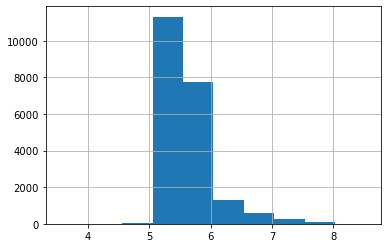

In [79]:
games['BayesAvgRating'].hist()

In [80]:
games['BayesAvgRating'].std()

0.36347781508541205

## Position

In [ ]:
# prepare dictionary to store results
models = {}
models['model'] = []
models['r2'] = []
models['mae'] = []
models['rmse'] = [] 

randomstate = np.random.randint(100)

In [ ]:
x = games.drop(['BGGId', 'Name', 'Description', 'Family', 'Theme', 'Category', 'ImagePath', 'Rank:boardgame', 'GoodPlayers',
               'Kickstarted', 'Rank:thematic', 'Rank:strategygames', 'Rank:wargames', 'Rank:familygames', 'Rank:cgs',
               'Rank:abstracts', 'Rank:partygames', 'Rank:childrensgames',  'BestPlayers', 'StdDev'], axis=1)
y = games['Rank:boardgame']

train, holdout, y_train, y_test = train_test_split(x, y, test_size=.2, random_state=randomstate)

In [ ]:
continuous = list(train.columns)
continuous.remove('BayesAvgRating')
polys = ['BayesAvgRating']
overall = continuous + polys
overall.append('Poly1')
overall.append('Poly2')

overall

In [ ]:
processed_train, processed_holdout = processing_pipeline(continuous, polys, overall, train, holdout)

In [ ]:
processed_train

In [ ]:
# Set upline models
baseline_models = {
    "LR": LinearRegression(),
    "Decision Tree": DecisionTreeRegressor(random_state = randomstate),
    "Extra Trees": ExtraTreesRegressor(random_state = randomstate),
    "Gradient Boosted" : GradientBoostingRegressor(random_state = randomstate),
    "KNN" : KNeighborsRegressor(),
    "LinearSVR" : LinearSVR(random_state = randomstate),
    "MLPRegressor" : MLPRegressor(random_state = randomstate),
    "Bayesian Ridge" : BayesianRidge(),
    "Nu SVR": NuSVR(),
    "Orthogonal Matching Pursuit" : OrthogonalMatchingPursuit(),
    "Ridge" : Ridge(random_state = randomstate, tol=1e-3, normalize=False),
    "SVR" : SVR(),
    "XGB Regressor" : xgb.XGBRegressor(random_state = randomstate),
    "Random Forest Regressor" : RandomForestRegressor(random_state=randomstate)
}

# run spot check on each model inline
for model in baseline_models:
    this_model = baseline_models[model]
    label = model
    spot_check = score_model(this_model, processed_train, y_train, label, models)

In [ ]:
# make data frame from our models dictionary
target = pd.DataFrame(models).reset_index(drop=True)

# sort data frame by mae and reset index
target.sort_values('mae', ascending=True).head(20)

In [ ]:
model = RandomForestRegressor(random_state = randomstate)
model.fit(processed_train, y_train)

from sklearn.inspection import permutation_importance
r = permutation_importance(model, processed_train, y_train,
                           n_repeats=15,
                            random_state=0,
                          n_jobs=-1)

for i in r.importances_mean.argsort()[::-1]:
    if r.importances_mean[i] >= 0.001:
        print(f"{processed_train.columns[i]:<8} "
            f"\t\tImportance: {r.importances_mean[i]:.3f} ")
        
importances = {}

for i in r.importances_mean.argsort()[::-1]:
    if r.importances_mean[i] >= 0.001:
        importances[processed_train.columns[i]] = r.importances_mean[i]
    else: continue
        
importances

important_features = list(importances.keys())
print(important_features)

permutations_train = processed_train[important_features]
permutations_test = processed_holdout[important_features]

In [ ]:
model = RandomForestRegressor(random_state = randomstate)
model.fit(permutations_train, y_train)
preds_train = model.predict(permutations_train)
preds = model.predict(permutations_test)

print("MAE: ",int(mean_absolute_error(preds, y_test)))
print("RMSE:",int(np.sqrt(mean_squared_error(preds, y_test))))
print("R2:", r2_score(preds, y_test)*100)

In [ ]:
fig, ax = plt.subplots(figsize=(20, 15))
plt.scatter(games['Rank:boardgame'], games['BayesAvgRating'])

## Bayesian Score

In [ ]:
# prepare dictionary to store results
models = {}
models['model'] = []
models['r2'] = []
models['mae'] = []
models['rmse'] = [] 

randomstate=42

In [ ]:
bayes_study = games.join(ratings_dist.set_index('BGGId'), on='BGGId', how='left').reset_index().drop(['BGGId', 
                        'Name', 'Description', 'GoodPlayers', 'Family', 'Theme', 'Category', 'ImagePath', 'num_votes',
                        'Rank:boardgame', 'Rank:thematic', 'Rank:strategygames', 'Rank:wargames', 'Rank:familygames',
                        'Rank:cgs', 'Rank:abstracts', 'Rank:partygames', 'Rank:childrensgames', 'index'], axis=1)
bayes_study

In [ ]:
x = bayes_study.drop('BayesAvgRating', axis=1)
y = games['BayesAvgRating']

train, holdout, y_train, y_test = train_test_split(x, y, test_size=.2, random_state=42)

In [ ]:
continuous = list(train.columns)
overall = list(train.columns)
poly = []
processed_train, processed_holdout = processing_pipeline(continuous, poly, overall, train, holdout)

In [ ]:
# Set upline models
baseline_models = {
    "LR": LinearRegression(),
    "Decision Tree": DecisionTreeRegressor(random_state = randomstate),
    "Extra Trees": ExtraTreesRegressor(random_state = randomstate),
    "Gradient Boosted" : GradientBoostingRegressor(random_state = randomstate),
    "XGB Regressor" : xgb.XGBRegressor(random_state = randomstate),
    "Random Forest Regressor" : RandomForestRegressor(random_state=randomstate)
}

# run spot check on each model inline
for model in baseline_models:
    this_model = baseline_models[model]
    label = model
    spot_check = score_model(this_model, processed_train, y_train, label, models)

In [ ]:
# make data frame from our models dictionary
target = pd.DataFrame(models).reset_index(drop=True)

# sort data frame by mae and reset index
target.sort_values('mae', ascending=True).head(20)

In [ ]:
model = LinearRegression()
model.fit(processed_train, y_train)

from sklearn.inspection import permutation_importance
r = permutation_importance(model, processed_train, y_train,
                           n_repeats=15,
                            random_state=0,
                          n_jobs=-1)

for i in r.importances_mean.argsort()[::-1]:
    if r.importances_mean[i] >= 0.001:
        print(f"{processed_train.columns[i]:<8} "
            f"\t\tImportance: {r.importances_mean[i]:.3f} ")
        
importances = {}

for i in r.importances_mean.argsort()[::-1]:
    if r.importances_mean[i] >= 0.001:
        importances[processed_train.columns[i]] = r.importances_mean[i]
    else: continue
        
importances

important_features = list(importances.keys())
print(important_features)

permutations_train = processed_train[important_features]
permutations_test = processed_holdout[important_features]

In [ ]:
model = ExtraTreesRegressor(random_state = randomstate)
model.fit(processed_train, y_train)

from sklearn.inspection import permutation_importance
r = permutation_importance(model, processed_train, y_train,
                           n_repeats=15,
                            random_state=0,
                          n_jobs=-1)

for i in r.importances_mean.argsort()[::-1]:
    if r.importances_mean[i] >= 0.01:
        print(f"{processed_train.columns[i]:<8} "
            f"\t\tImportance: {r.importances_mean[i]:.3f} ")
        
importances = {}

for i in r.importances_mean.argsort()[::-1]:
    if r.importances_mean[i] >= 0.01:
        importances[processed_train.columns[i]] = r.importances_mean[i]
    else: continue
        
importances

important_features = list(importances.keys())
print(important_features)

permutations_train = processed_train[important_features]
permutations_test = processed_holdout[important_features]

In [ ]:
model.fit(permutations_train, y_train)
preds_train = model.predict(permutations_train)
preds = model.predict(permutations_test)

print("MAE: ",mean_absolute_error(preds, y_test))
print("RMSE:",np.sqrt(mean_squared_error(preds, y_test)))
print("R2:", r2_score(preds, y_test)*100)

## Manual Bayesian Score

bayes avg = productRatingsAvg * productRatingsCount + C x m     /    productRatingsCount + C

m = overall average rating of store's catalog
C = Confidence constant (selected)

In [ ]:
first_game = 100
second_game = 20000

first_bayes = games.loc[first_game]['BayesAvgRating']
first_rating = games.loc[first_game]['AvgRating']
first_count = games.loc[first_game]['NumUserRatings']

second_bayes = games.loc[second_game]['BayesAvgRating']
second_rating = games.loc[second_game]['AvgRating']
second_count = games.loc[second_game]['NumUserRatings']

In [ ]:
#bayes = ((rating * count) + (m * c)) / (count + c)

#first_bayes = ((first_rating * first_count) + (m * c)) / (first_count + c)
#second_bayes = ((second_rating * second_count) + (m * c)) / (second_count + c)

#(second_bayes * second_count) + (second_bayes * c) - (second_rating * second_count) =  (m * c)
#m = ((second_bayes * second_count) + (second_bayes * c) - (second_rating * second_count)) / c

#first_bayes = ((first_rating * first_count) + ((second_bayes * second_count) + (second_bayes * c) - (second_rating * second_count)) / (first_count + c)
#(first_bayes*first_count) + (first_bayes*c) = (first_rating * first_count) + (second_bayes * second_count) + (second_bayes * c) - (second_rating * second_count)
               
#(first_bayes * c) - (second_bayes * c) = (first_rating * first_count) + (second_bayes * second_count) - (second_rating * second_count) - (first_bayes*first_count) 
c = ((first_rating * first_count) + (second_bayes * second_count) - (second_rating * second_count) - (first_bayes*first_count)) / (first_bayes - second_bayes)
m = ((second_bayes * second_count) + (second_bayes * c) - (second_rating * second_count)) / c

c = int(c)
m = round(m, 2)

c, m

In [ ]:
specific_game=15000

first_bayes = games.iloc[specific_game]['BayesAvgRating']
first_rating = games.loc[specific_game]['AvgRating']
first_count = games.loc[specific_game]['NumUserRatings']

estimated_bayes = round(((first_rating * first_count) + (m * c)) / (first_count + c), 5)

print("User Rating:",first_rating)
print("Number of User Ratings:", first_count)
print("Actual Bayes:",first_bayes)
print("Estimated Bayes:", estimated_bayes)

# Umap Visuals

In [13]:
included = ['BGGId', 'YearPublished', 'GameWeight',
       'AvgRating', 'BayesAvgRating', 'StdDev', 'MinPlayers', 'MaxPlayers',
       'BestPlayers','NumOwned',
       'NumWant', 'NumWish', 'NumWeightVotes', 'MfgPlaytime', 'Playtime', 'MfgAgeRec', 'NumUserRatings', 'NumComments',
       'NumAlternates', 'NumExpansions', 'NumAwards', 'NumImplementations',
       'NumFans', 'NumPageViews', 'RulesPosts', 'TotalPosts', 'IsExpansion',
       'IsReimplementation', 'Kickstarted',
       'Rank:boardgame', 
        'Rank:thematic', 'Rank:strategygames',
       'Rank:wargames', 'Rank:familygames', 'Rank:cgs', 'Rank:abstracts',
       'Rank:partygames', 'Rank:childrensgames', 'Cat:Thematic',
       'Cat:Strategy', 'Cat:War', 'Cat:Family', 'Cat:CGS', 'Cat:Abstract',
       'Cat:Party', 'Cat:Childrens'] 
umap_games = games[included]
umap_games.head()

,BGGId,YearPublished,GameWeight,AvgRating,BayesAvgRating,StdDev,MinPlayers,MaxPlayers,BestPlayers,NumOwned,NumWant,NumWish,NumWeightVotes,MfgPlaytime,Playtime,MfgAgeRec,NumUserRatings,NumComments,NumAlternates,NumExpansions,NumAwards,NumImplementations,NumFans,NumPageViews,RulesPosts,TotalPosts,IsExpansion,IsReimplementation,Kickstarted,Rank:boardgame,Rank:thematic,Rank:strategygames,Rank:wargames,Rank:familygames,Rank:cgs,Rank:abstracts,Rank:partygames,Rank:childrensgames,Cat:Thematic,Cat:Strategy,Cat:War,Cat:Family,Cat:CGS,Cat:Abstract,Cat:Party,Cat:Childrens
0,174430,2017,3.8726,8.76029,8.52385,1.63358,1,4,3,74975,1375,17276,2009,120,180.0,14,46228,8308,6,12,30,0,7718,10816029,6326,14752,0,0,1,1,1,1,21369,21369,21369,21369,21369,21369,1,1,0,0,0,0,0,0
1,161936,2015,2.8331,8.60116,8.45000,1.56368,2,4,4,68974,840,11544,1210,60,120.0,13,44043,6682,10,0,30,2,2952,3450336,1229,3086,0,1,0,2,2,3,21369,21369,21369,21369,21369,21369,1,1,0,0,0,0,0,0
2,224517,2018,3.9038,8.66907,8.41066,1.24331,2,4,3,35448,1528,11277,1143,120,180.0,14,23776,3610,6,0,18,1,1902,1974872,387,1028,0,1,1,3,21369,2,21369,21369,21369,21369,21369,21369,0,1,0,0,0,0,0,0
3,167791,2016,3.2429,8.42155,8.27751,1.38628,1,5,3,97330,2061,18842,2944,120,240.0,12,71474,10452,14,22,39,2,6372,6285054,1155,4313,0,0,0,4,21369,6,21369,21369,21369,21369,21369,21369,0,1,0,0,0,0,0,0
4,291457,2020,3.5649,8.72198,8.25902,1.42169,1,4,2,33444,477,6250,485,120,150.0,14,13939,2149,6,0,11,0,1649,1471587,1073,2062,0,0,0,5,3,5,21369,21369,21369,21369,21369,21369,1,1,0,0,0,0,0,0


In [14]:
umap_games['Rank:boardgame'] = umap_games['Rank:boardgame'].max() - umap_games['Rank:boardgame']
umap_games['Rank:familygames'] = umap_games['Rank:familygames'].max() - umap_games['Rank:familygames']
umap_games['Rank:strategygames'] = umap_games['Rank:strategygames'].max() - umap_games['Rank:strategygames']
umap_games['Rank:partygames'] = umap_games['Rank:partygames'].max() - umap_games['Rank:partygames']
umap_games['Rank:thematic'] = umap_games['Rank:thematic'].max() - umap_games['Rank:thematic']
umap_games['Rank:wargames'] = umap_games['Rank:wargames'].max() - umap_games['Rank:wargames']
umap_games['Rank:cgs'] = umap_games['Rank:cgs'].max() - umap_games['Rank:cgs']
umap_games['Rank:abstracts'] = umap_games['Rank:abstracts'].max() - umap_games['Rank:abstracts']
umap_games['Rank:childrensgames'] = umap_games['Rank:childrensgames'].max() - umap_games['Rank:childrensgames']

In [15]:
mechanics = pd.read_pickle('data_cleaned/mechanics.pkl')
subcategories = pd.read_pickle('data_cleaned/subcategories.pkl')

In [16]:
join1 = umap_games.join(mechanics.set_index('BGGId'), on='BGGId', how='left').reset_index(drop=True)
join2 = join1.join(subcategories.set_index('BGGId'), on='BGGId', how='left').reset_index(drop=True)

In [17]:
join1.drop('BGGId', axis=1, inplace=True)
join2.drop('BGGId', axis=1, inplace=True)
umap_games.drop('BGGId', axis=1, inplace=True)

In [18]:
scaler=MinMaxScaler()

In [19]:
join1_scaled=join1[join1.columns]
join2_scaled=join2[join2.columns]
umap_games_scaled=umap_games[umap_games.columns]

In [20]:
for column in join1.columns:
    join1_scaled[column] = scaler.fit_transform(np.array(join1[column]).reshape(-1,1))
for column in join2.columns:
    join2_scaled[column] = scaler.fit_transform(np.array(join2[column]).reshape(-1,1))
for column in umap_games.columns:
    umap_games_scaled[column] = scaler.fit_transform(np.array(umap_games[column]).reshape(-1,1))    

In [21]:
umap_games.head()

,YearPublished,GameWeight,AvgRating,BayesAvgRating,StdDev,MinPlayers,MaxPlayers,BestPlayers,NumOwned,NumWant,NumWish,NumWeightVotes,MfgPlaytime,Playtime,MfgAgeRec,NumUserRatings,NumComments,NumAlternates,NumExpansions,NumAwards,NumImplementations,NumFans,NumPageViews,RulesPosts,TotalPosts,IsExpansion,IsReimplementation,Kickstarted,Rank:boardgame,Rank:thematic,Rank:strategygames,Rank:wargames,Rank:familygames,Rank:cgs,Rank:abstracts,Rank:partygames,Rank:childrensgames,Cat:Thematic,Cat:Strategy,Cat:War,Cat:Family,Cat:CGS,Cat:Abstract,Cat:Party,Cat:Childrens
0,2017,3.8726,8.76029,8.52385,1.63358,1,4,3,74975,1375,17276,2009,120,180.0,14,46228,8308,6,12,30,0,7718,10816029,6326,14752,0,0,1,21480,21368,21368,0,0,0,0,0,0,1,1,0,0,0,0,0,0
1,2015,2.8331,8.60116,8.45000,1.56368,2,4,4,68974,840,11544,1210,60,120.0,13,44043,6682,10,0,30,2,2952,3450336,1229,3086,0,1,0,21479,21367,21366,0,0,0,0,0,0,1,1,0,0,0,0,0,0
2,2018,3.9038,8.66907,8.41066,1.24331,2,4,3,35448,1528,11277,1143,120,180.0,14,23776,3610,6,0,18,1,1902,1974872,387,1028,0,1,1,21478,0,21367,0,0,0,0,0,0,0,1,0,0,0,0,0,0
3,2016,3.2429,8.42155,8.27751,1.38628,1,5,3,97330,2061,18842,2944,120,240.0,12,71474,10452,14,22,39,2,6372,6285054,1155,4313,0,0,0,21477,0,21363,0,0,0,0,0,0,0,1,0,0,0,0,0,0
4,2020,3.5649,8.72198,8.25902,1.42169,1,4,2,33444,477,6250,485,120,150.0,14,13939,2149,6,0,11,0,1649,1471587,1073,2062,0,0,0,21476,21366,21364,0,0,0,0,0,0,1,1,0,0,0,0,0,0


In [22]:
umap_games_scaled.head()

,YearPublished,GameWeight,AvgRating,BayesAvgRating,StdDev,MinPlayers,MaxPlayers,BestPlayers,NumOwned,NumWant,NumWish,NumWeightVotes,MfgPlaytime,Playtime,MfgAgeRec,NumUserRatings,NumComments,NumAlternates,NumExpansions,NumAwards,NumImplementations,NumFans,NumPageViews,RulesPosts,TotalPosts,IsExpansion,IsReimplementation,Kickstarted,Rank:boardgame,Rank:thematic,Rank:strategygames,Rank:wargames,Rank:familygames,Rank:cgs,Rank:abstracts,Rank:partygames,Rank:childrensgames,Cat:Thematic,Cat:Strategy,Cat:War,Cat:Family,Cat:CGS,Cat:Abstract,Cat:Party,Cat:Childrens
0,0.999275,0.77452,0.900262,1.000000,0.352034,0.1,0.307692,0.200000,0.456159,0.667152,0.913687,0.263234,0.002,0.500000,0.56,0.431773,0.433899,0.007059,0.022857,0.60,0.000000,1.000000,1.000000,1.000000,1.000000,0.0,0.0,1.0,1.000000,1.000000,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.998913,0.56662,0.881702,0.985087,0.334901,0.2,0.307692,0.266667,0.419647,0.407569,0.610535,0.158543,0.001,0.333333,0.52,0.411352,0.348968,0.011765,0.000000,0.60,0.054054,0.382483,0.318957,0.194278,0.209192,0.0,1.0,0.0,0.999953,0.999953,0.999906,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.999457,0.78076,0.889623,0.977143,0.256379,0.2,0.307692,0.200000,0.215665,0.741388,0.596414,0.149764,0.002,0.500000,0.56,0.221934,0.188509,0.007059,0.000000,0.36,0.027027,0.246437,0.182533,0.061176,0.069685,0.0,1.0,1.0,0.999907,0.000000,0.999953,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.999094,0.64858,0.860752,0.950256,0.291421,0.1,0.384615,0.200000,0.592174,1.000000,0.996509,0.385744,0.002,0.666667,0.48,0.667726,0.545887,0.016471,0.041905,0.78,0.054054,0.825602,0.581059,0.182580,0.292367,0.0,0.0,0.0,0.999860,0.000000,0.999766,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.999819,0.71298,0.895794,0.946522,0.300100,0.1,0.307692,0.133333,0.203472,0.231441,0.330548,0.063548,0.002,0.416667,0.56,0.129996,0.112196,0.007059,0.000000,0.22,0.000000,0.213656,0.135999,0.169617,0.139778,0.0,0.0,0.0,0.999814,0.999906,0.999813,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


<AxesSubplot:>

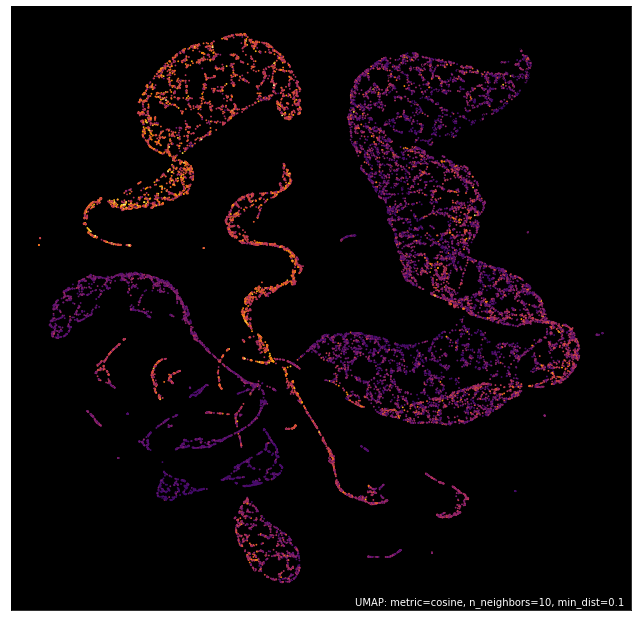

In [16]:
mapper = umap.UMAP(n_neighbors=10, metric='cosine').fit(umap_games)
umap.plot.points(mapper, theme='inferno', values = umap_games.GameWeight)

<AxesSubplot:>

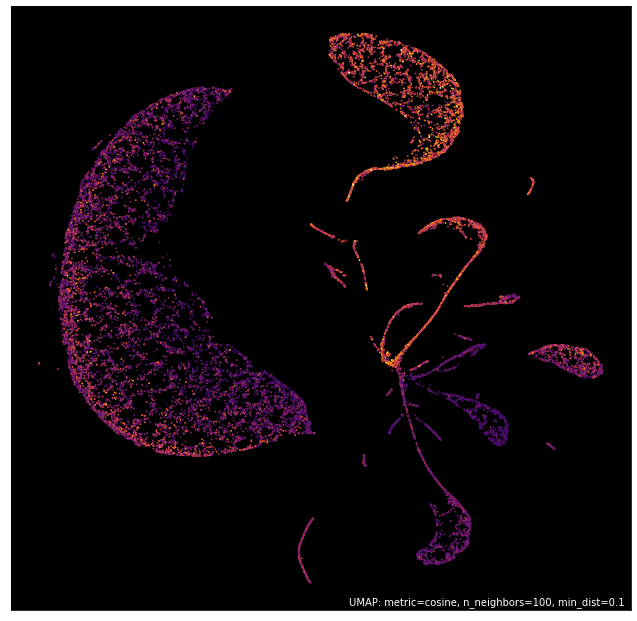

In [17]:
mapper = umap.UMAP(n_neighbors=100, metric='cosine').fit(umap_games)
umap.plot.points(mapper, theme='inferno', values = umap_games.GameWeight)

<AxesSubplot:>

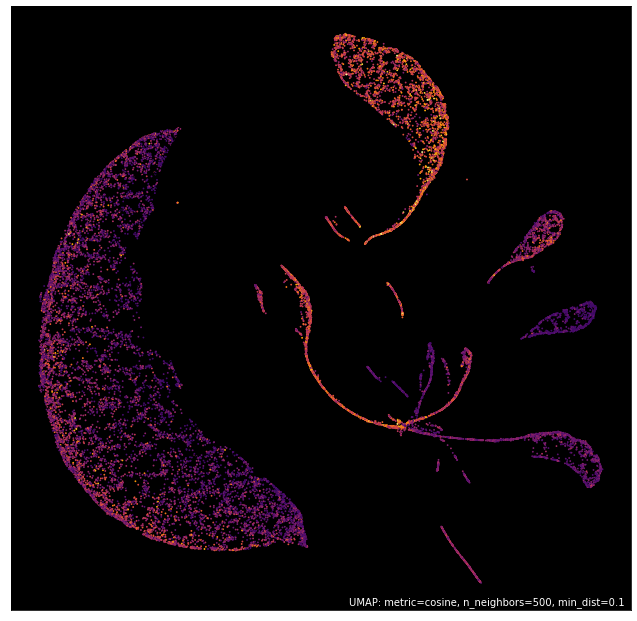

In [18]:
mapper = umap.UMAP(n_neighbors=500, metric='cosine').fit(umap_games)
umap.plot.points(mapper, theme='inferno', values = umap_games.GameWeight)

<AxesSubplot:>

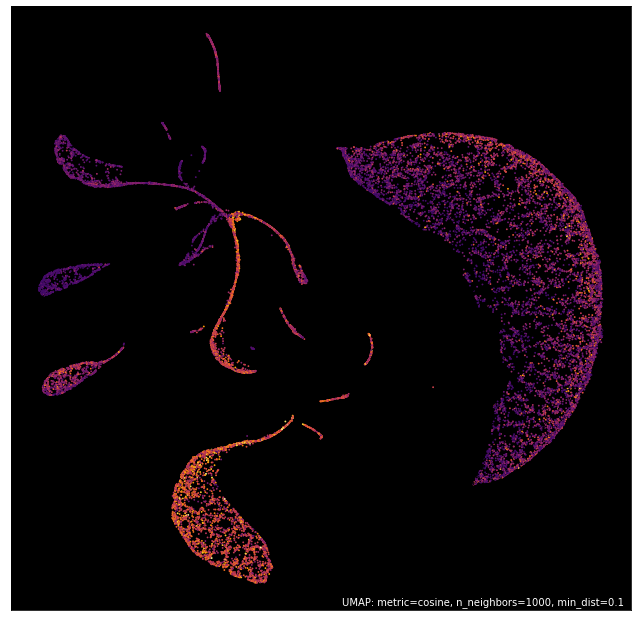

In [19]:
mapper = umap.UMAP(n_neighbors=1000, metric='cosine').fit(umap_games)
umap.plot.points(mapper, theme='inferno', values = umap_games.GameWeight)

## Umap Visual Refinement

<AxesSubplot:>

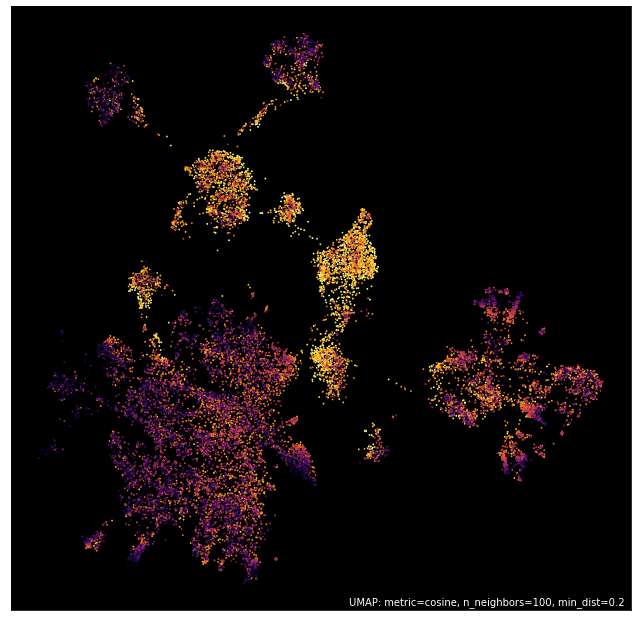

In [72]:
mapper = umap.UMAP(n_neighbors=100, metric='cosine', min_dist=0.2, random_state=2).fit(join2_scaled)
umap.plot.points(mapper, theme='inferno', values = join2_scaled['Rank:boardgame'])

### join2_scaled

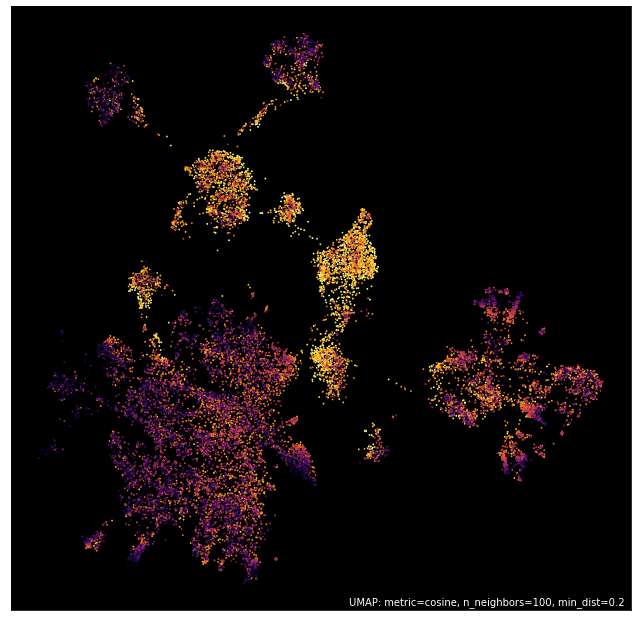

In [73]:
mapper = umap.UMAP(n_neighbors=100, metric='cosine', min_dist=0.2, random_state=2).fit(join2_scaled)
umap.plot.points(mapper, theme='inferno', values = join2_scaled['Rank:boardgame'])
plt.savefig('images/games_umap_rank.png', dpi=2000, bbox_inches='tight', transparent=True)

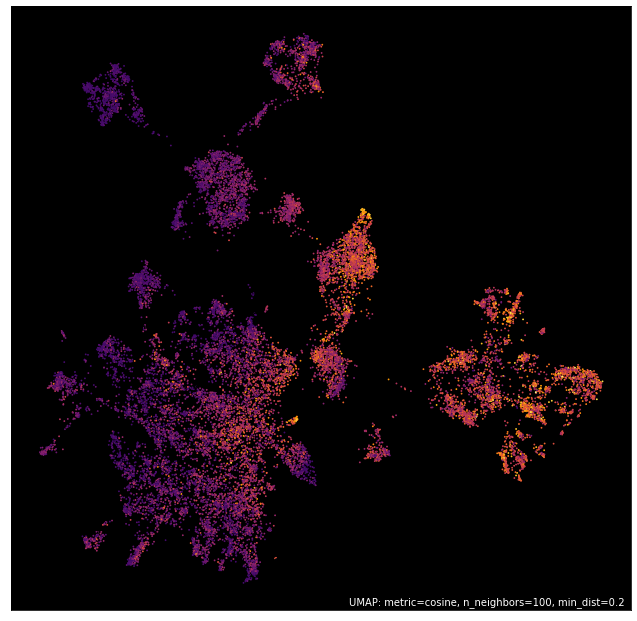

In [74]:
mapper = umap.UMAP(n_neighbors=100, metric='cosine', min_dist=0.2, random_state=2).fit(join2_scaled)
umap.plot.points(mapper, theme='inferno', values = join1_scaled.GameWeight)
plt.savefig('images/games_umap_weight.png', dpi=2000, bbox_inches='tight', transparent=True)

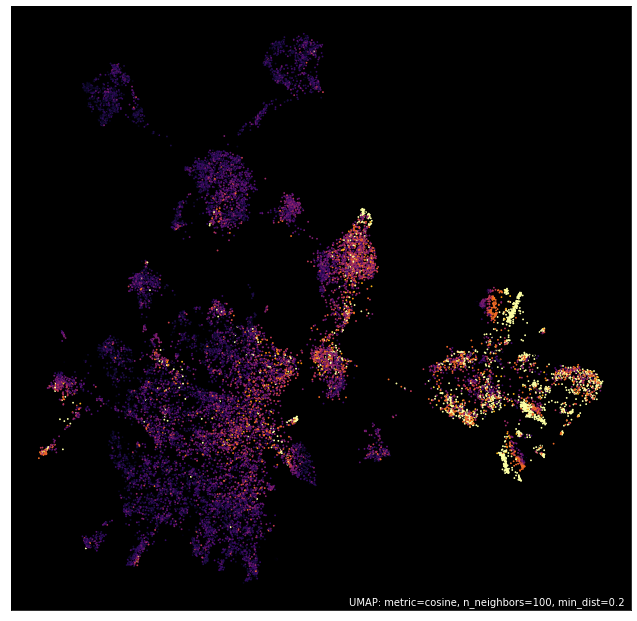

In [75]:
mapper = umap.UMAP(n_neighbors=100, metric='cosine', min_dist=0.2, random_state=2).fit(join2_scaled)
umap.plot.points(mapper, theme='inferno', values = join2_scaled.Playtime)
plt.savefig('images/games_umap_playtime.png', dpi=2000, bbox_inches='tight', transparent=True)

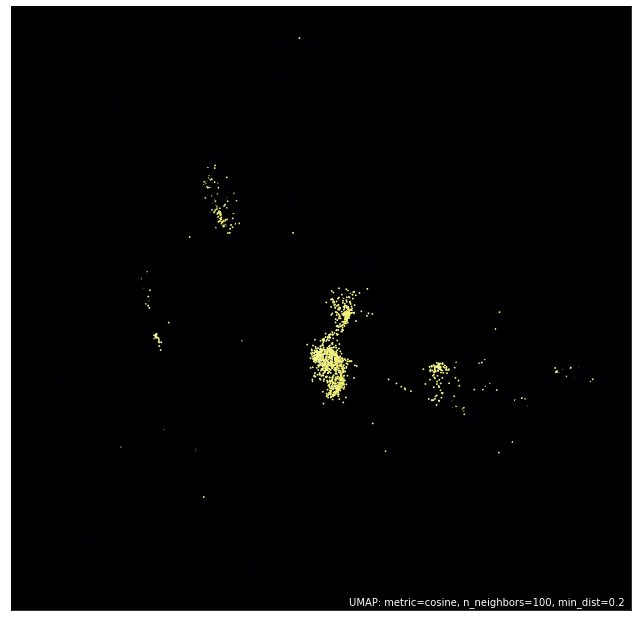

In [76]:
mapper = umap.UMAP(n_neighbors=100, metric='cosine', min_dist=0.2, random_state=2).fit(join2_scaled)
umap.plot.points(mapper, theme='inferno', values = join2_scaled['Rank:thematic'])
plt.savefig('images/games_umap_thematic.png', dpi=2000, bbox_inches='tight', transparent=True)

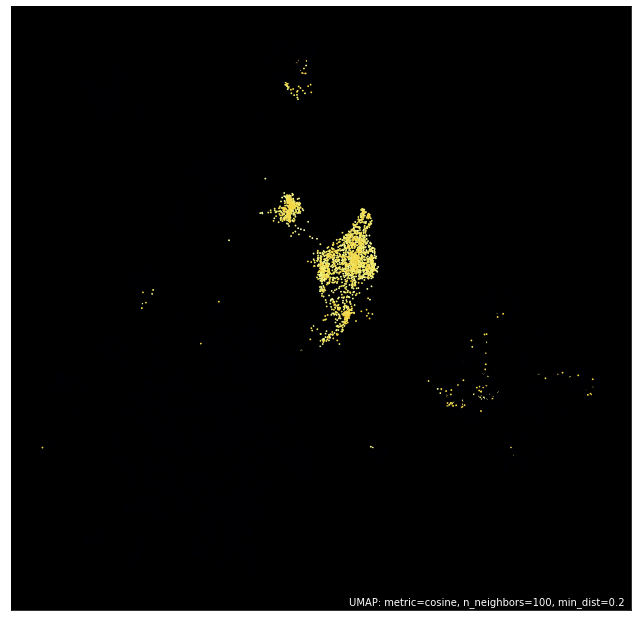

In [77]:
mapper = umap.UMAP(n_neighbors=100, metric='cosine', min_dist=0.2, random_state=2).fit(join2_scaled)
umap.plot.points(mapper, theme='inferno', values = join2_scaled['Rank:strategygames'])
plt.savefig('images/games_umap_strategygames.png', dpi=2000, bbox_inches='tight', transparent=True)

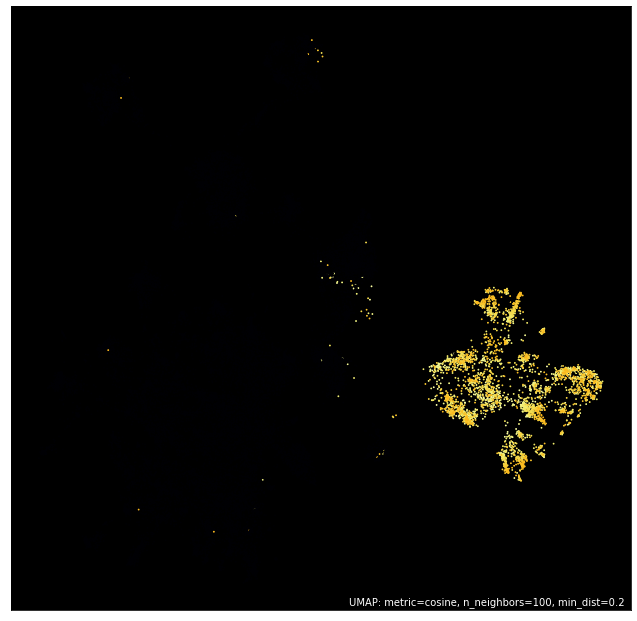

In [78]:
mapper = umap.UMAP(n_neighbors=100, metric='cosine', min_dist=0.2, random_state=2).fit(join2_scaled)
umap.plot.points(mapper, theme='inferno', values = join2_scaled['Rank:wargames'])
plt.savefig('images/games_umap_wargame.png', dpi=2000, bbox_inches='tight', transparent=True)

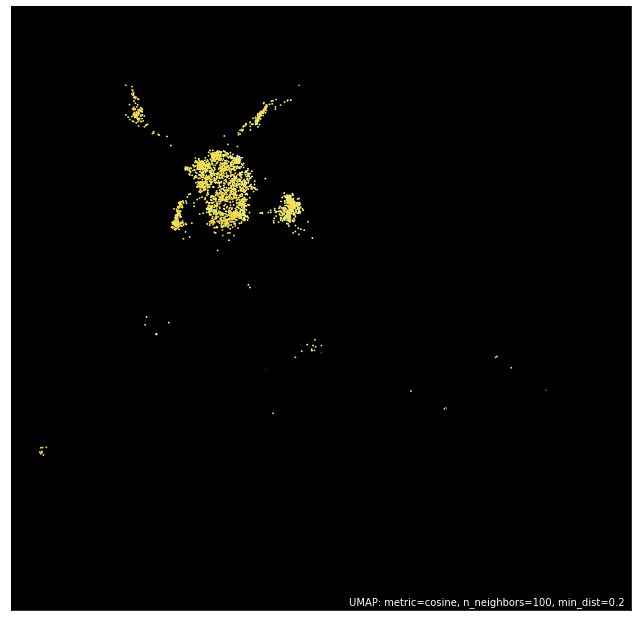

In [79]:
mapper = umap.UMAP(n_neighbors=100, metric='cosine', min_dist=0.2, random_state=2).fit(join2_scaled)
umap.plot.points(mapper, theme='inferno', values = join2_scaled['Rank:familygames'])
plt.savefig('images/games_umap_familygames.png', dpi=2000, bbox_inches='tight', transparent=True)

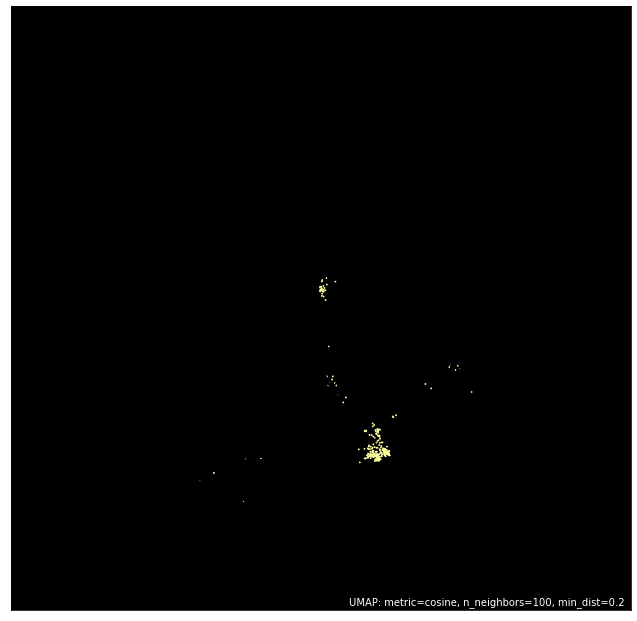

In [80]:
mapper = umap.UMAP(n_neighbors=100, metric='cosine', min_dist=0.2, random_state=2).fit(join2_scaled)
umap.plot.points(mapper, theme='inferno', values = join2_scaled['Rank:cgs'])
plt.savefig('images/games_umap_cgs.png', dpi=2000, bbox_inches='tight', transparent=True)

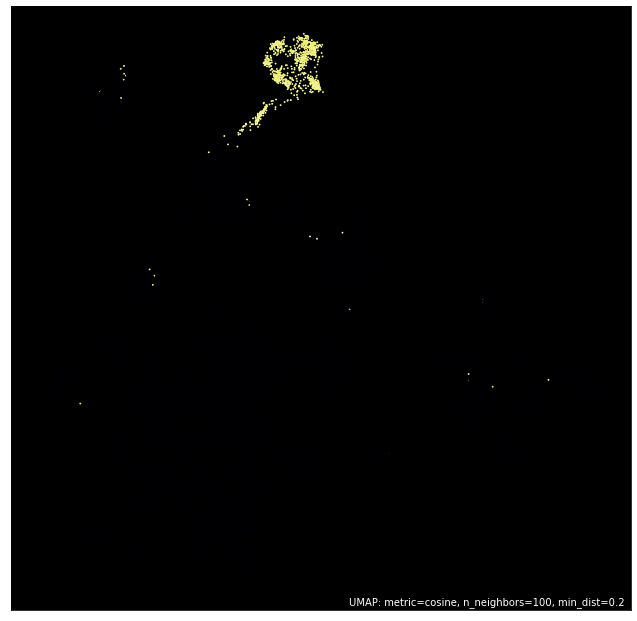

In [81]:
mapper = umap.UMAP(n_neighbors=100, metric='cosine', min_dist=0.2, random_state=2).fit(join2_scaled)
umap.plot.points(mapper, theme='inferno', values = join2_scaled['Rank:abstracts'])
plt.savefig('images/games_umap_abstracts.png', dpi=2000, bbox_inches='tight', transparent=True)

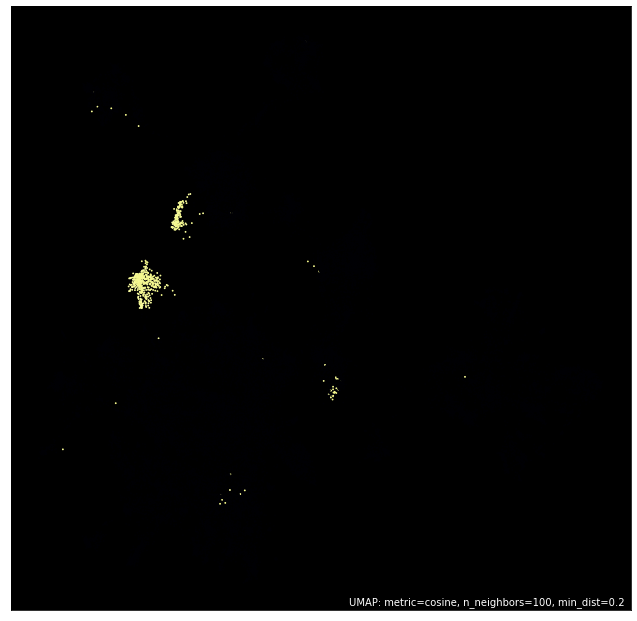

In [82]:
mapper = umap.UMAP(n_neighbors=100, metric='cosine', min_dist=0.2, random_state=2).fit(join2_scaled)
umap.plot.points(mapper, theme='inferno', values = join2_scaled['Rank:partygames'])
plt.savefig('images/games_umap_partygames.png', dpi=2000, bbox_inches='tight', transparent=True)

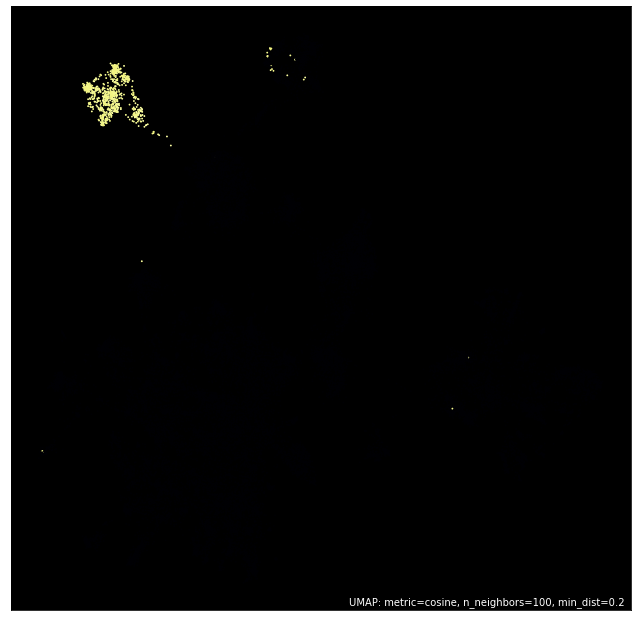

In [83]:
mapper = umap.UMAP(n_neighbors=100, metric='cosine', min_dist=0.2, random_state=2).fit(join2_scaled)
umap.plot.points(mapper, theme='inferno', values = join2_scaled['Rank:childrensgames'])
plt.savefig('images/games_umap_childrens.png', dpi=2000, bbox_inches='tight', transparent=True)

### Umap_games unscaled

<AxesSubplot:>

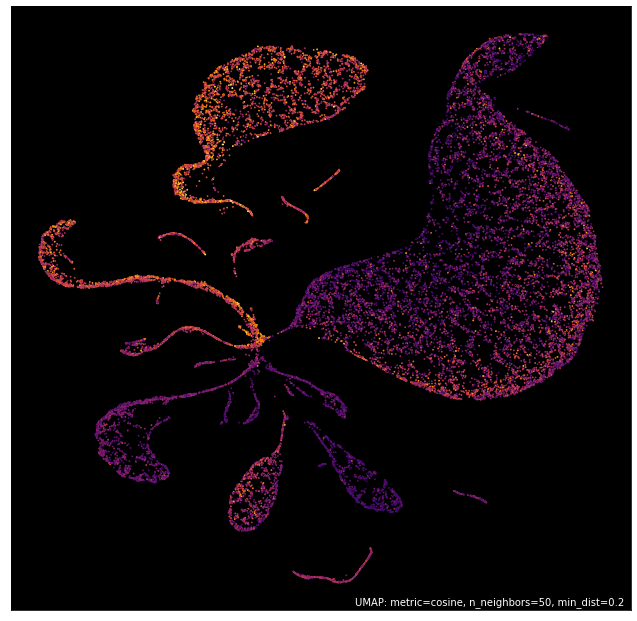

In [24]:
mapper = umap.UMAP(n_neighbors=50, metric='cosine', min_dist=.2, random_state=2).fit(umap_games)
umap.plot.points(mapper, theme='inferno', values = umap_games.GameWeight)

<AxesSubplot:>

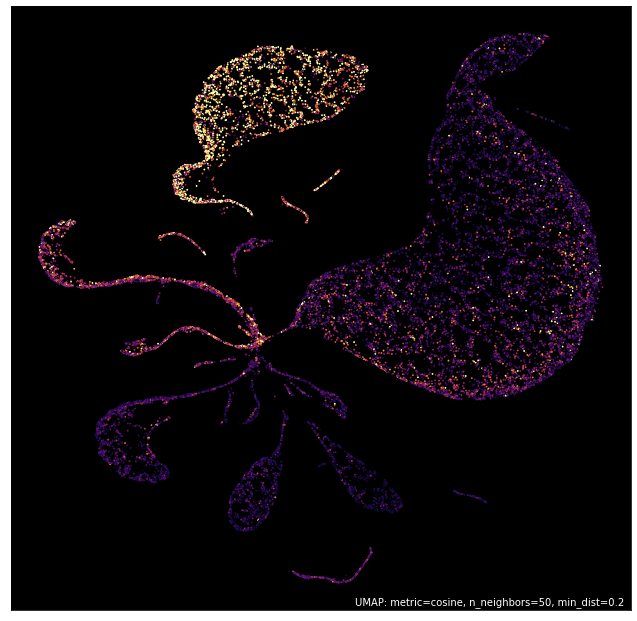

In [25]:
mapper = umap.UMAP(n_neighbors=50, metric='cosine', min_dist=.2, random_state=2).fit(umap_games)
umap.plot.points(mapper, theme='inferno', values = umap_games.Playtime)

<AxesSubplot:>

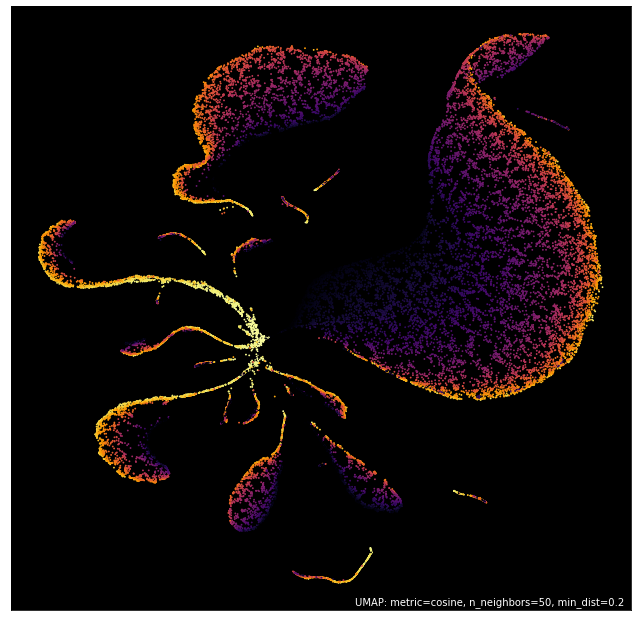

In [29]:
mapper = umap.UMAP(n_neighbors=50, metric='cosine', min_dist=.2, random_state=2).fit(umap_games)
umap.plot.points(mapper, theme='inferno', values = umap_games['Rank:boardgame'])

### Join2 unscaled

<AxesSubplot:>

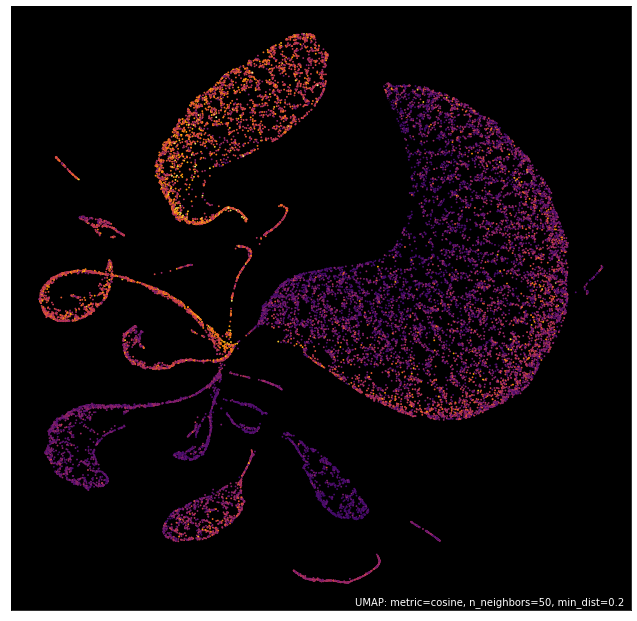

In [30]:
mapper = umap.UMAP(n_neighbors=50, metric='cosine', min_dist=.2, random_state=2).fit(join2)
umap.plot.points(mapper, theme='inferno', values = join2.GameWeight)

<AxesSubplot:>

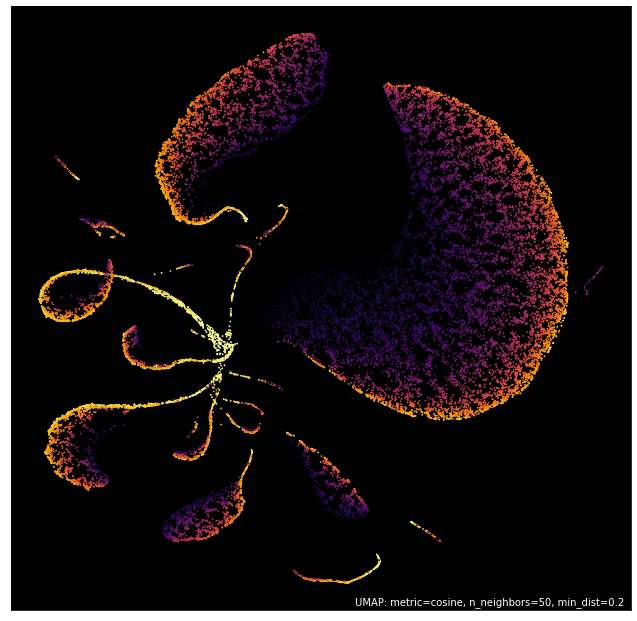

In [31]:
mapper = umap.UMAP(n_neighbors=50, metric='cosine', min_dist=.2, random_state=2).fit(join2)
umap.plot.points(mapper, theme='inferno', values = join2['Rank:boardgame'])

### Umap scaled

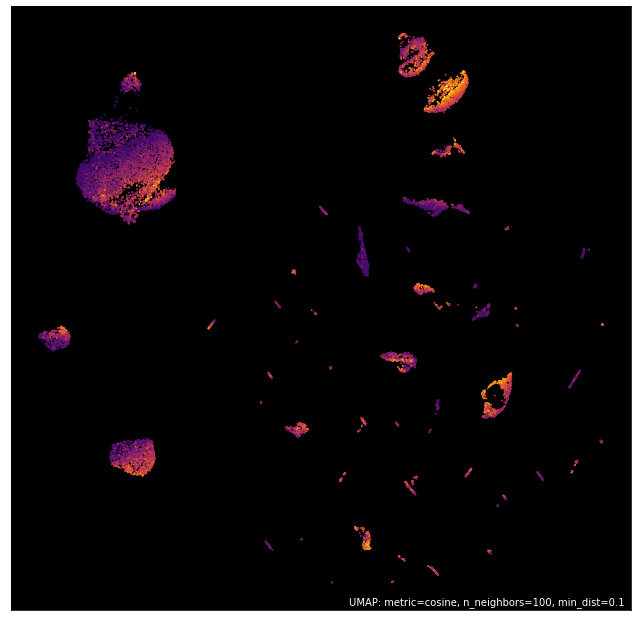

In [47]:
mapper = umap.UMAP(n_neighbors=50, metric='cosine', random_state=2).fit(umap_games_scaled)
umap.plot.points(mapper, theme='inferno', values = umap_games_scaled.GameWeight)

<AxesSubplot:>

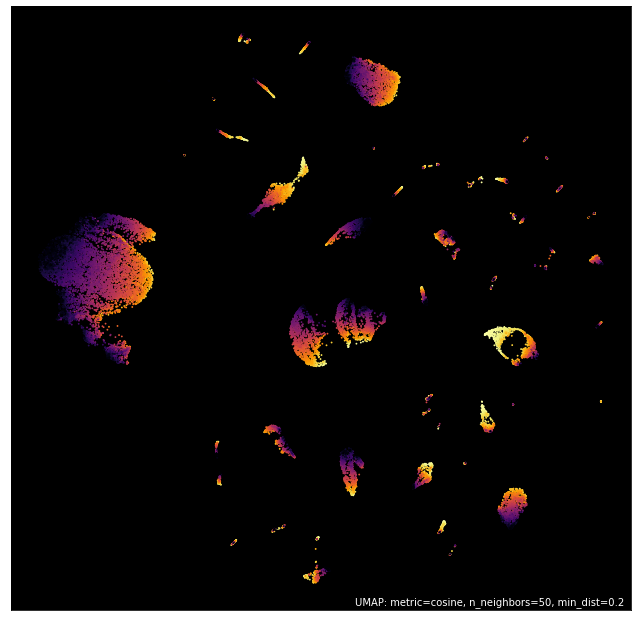

In [85]:
mapper = umap.UMAP(n_neighbors=50, metric='cosine', min_dist=.2, random_state=2).fit(umap_games_scaled)
umap.plot.points(mapper, theme='inferno', values = umap_games_scaled['Rank:boardgame'])

## Mechanics

In [94]:
mechanics = pd.read_pickle('data_cleaned/mechanics.pkl')
subcategories = pd.read_pickle('data_cleaned/subcategories.pkl')

In [95]:
join1 = games.join(mechanics.set_index('BGGId'), on='BGGId', how='left').reset_index(drop=True)
join2 = join1.join(subcategories.set_index('BGGId'), on='BGGId', how='left').reset_index(drop=True)

In [96]:
drop_columns = ['BGGId', 'Name', 'Description', 'GoodPlayers', 'Family', 'Theme', 'Category', 'ImagePath', 
                'ComAgeRec', 'LanguageEase',  
        'Rank:thematic', 'Rank:strategygames',
       'Rank:wargames', 'Rank:familygames', 'Rank:cgs', 'Rank:abstracts',
       'Rank:partygames', 'Rank:childrensgames', 'Cat:Thematic',
       'Cat:Strategy', 'Cat:War', 'Cat:Family', 'Cat:CGS', 'Cat:Abstract',
       'Cat:Party', 'Cat:Childrens']

In [97]:
join2.drop(drop_columns, axis=1, inplace=True)

In [98]:
join2.head()

,YearPublished,GameWeight,AvgRating,BayesAvgRating,StdDev,MinPlayers,MaxPlayers,BestPlayers,NumOwned,NumWant,NumWish,NumWeightVotes,MfgPlaytime,ComMinPlaytime,ComMaxPlaytime,MfgAgeRec,NumUserRatings,NumComments,NumAlternates,NumExpansions,NumAwards,NumImplementations,NumFans,NumPageViews,RulesPosts,TotalPosts,IsExpansion,IsReimplementation,Kickstarted,Rank:boardgame,Playtime,Action Queue,Action Retrieval,Campaign / Battle Card Driven,Card Play Conflict Resolution,Communication Limits,Cooperative Game,Critical Hits and Failures,Deck Construction,"Deck, Bag, and Pool Building",Grid Movement,Hand Management,Hexagon Grid,Legacy Game,Modular Board,Once-Per-Game Abilities,Scenario / Mission / Campaign Game,Simultaneous Action Selection,Solo / Solitaire Game,Storytelling,Variable Player Powers,Action Points,Point to Point Movement,Set Collection,Trading,Income,Loans,Market,Network and Route Building,Score-and-Reset Game,Tech Trees / Tech Tracks,Variable Set-up,Drafting,End Game Bonuses,TableauBuilding,Take That,Tile Placement,Line of Sight,Action Drafting,Area Majority / Influence,Area-Impulse,Dice Rolling,Follow,King of the Hill,Variable Phase Order,Voting,Victory Points as a Resource,Area Movement,Delayed Purchase,Team-Based Game,Auction/Bidding,Events,Hidden Movement,Movement Points,Simulation,Ownership,Rondel,Track Movement,Action/Event,Advantage Token,Sudden Death Ending,Tug of War,Force Commitment,Narrative Choice / Paragraph,Grid Coverage,Layering,Increase Value of Unchosen Resources,Hidden Roles,Player Elimination,Semi-Cooperative Game,Traitor Game,Automatic Resource Growth,Push Your Luck,Worker Placement,Role Playing,Stat Check Resolution,Contracts,Race,Hidden Victory Points,Memory,Enclosure,Stock Holding,Pick-up and Deliver,Map Addition,Die Icon Resolution,Resource to Move,Trick-taking,Move Through Deck,Bias,Catch the Leader,Programmed Movement,Slide/Push,Commodity Speculation,Square Grid,Moving Multiple Units,Alliances,Kill Steal,Passed Action Token,Pattern Building,Investment,Secret Unit Deployment,Highest-Lowest Scoring,Mancala,Lose a Turn,Betting and Bluffing,Negotiation,Time Track,Connections,Targeted Clues,Order Counters,Bingo,Line Drawing,Paper-and-Pencil,Deduction,Movement Template,Multiple Maps,Re-rolling and Locking,Roll / Spin and Move,Finale Ending,Roles with Asymmetric Information,Command Cards,"I Cut, You Choose",Prisoner's Dilemma,Interrupts,Real-Time,Ladder Climbing,Predictive Bid,Three Dimensional Movement,Zone of Control,Random Production,Relative Movement,Cube Tower,Bribery,Map Deformation,Elapsed Real Time Ending,Melding and Splaying,Pieces as Map,Pattern Movement,Static Capture,Pattern Recognition,Minimap Resolution,Map Reduction,Ratio / Combat Results Table,Single Loser Game,Chaining,Different Dice Movement,Measurement Movement,Action Timer,Physical Removal,Induction,Speed Matching,Player Judge,Crayon Rail System,Chit-Pull System,Matching,Impulse Movement,Dexterity,Physical,Exploration,Miniatures,Territory Building,Card Game,Educational,Puzzle,Collectible Components,Word Game,Print & Play,Electronic
0,2017,3.8726,8.76029,8.52385,1.63358,1,4,3,74975,1375,17276,2009,120,60,120,14,46228,8308,6,12,30,0,7718,10816029,6326,14752,0,0,1,1,180.0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0
1,2015,2.8331,8.60116,8.45000,1.56368,2,4,4,68974,840,11544,1210,60,60,60,13,44043,6682,10,0,30,2,2952,3450336,1229,3086,0,1,0,2,120.0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

In [99]:
scaler = MinMaxScaler()
scaled_stuff = scaler.fit_transform(join2)

<AxesSubplot:>

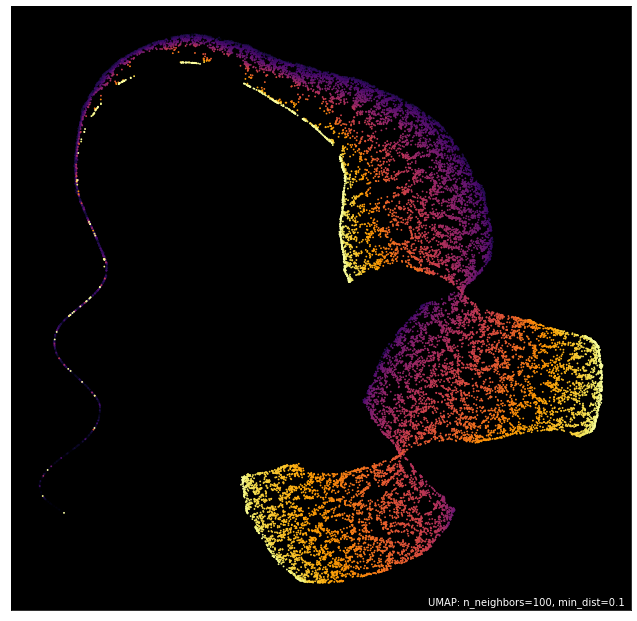

In [103]:
mapper = umap.UMAP(n_neighbors=100).fit(join2)
umap.plot.points(mapper, theme='inferno', values = join2['Rank:boardgame'])

In [101]:
mechs_cats =  mechanics.join(subcategories.set_index('BGGId'), on='BGGId', how='left').reset_index(drop=True)
mechs_cats['Rank:boardgame'] = games['Rank:boardgame']

<AxesSubplot:>

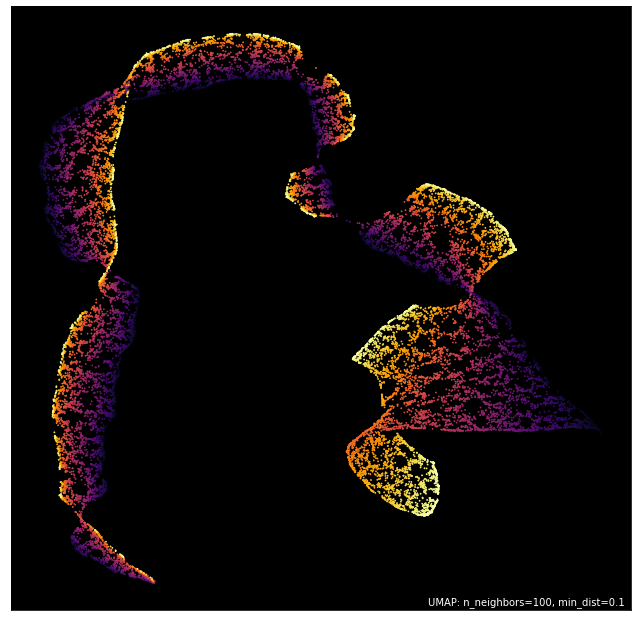

In [102]:
mapper = umap.UMAP(n_neighbors=100).fit(mechs_cats)
umap.plot.points(mapper, theme='inferno', values = mechs_cats['Rank:boardgame'])